# Projet P2 - Analysez des données de systèmes éducatifs
*OPENCLASSROOMS - Parcours Data Scientist - Adeline Le Ray - Septembre 2023*
<hr>

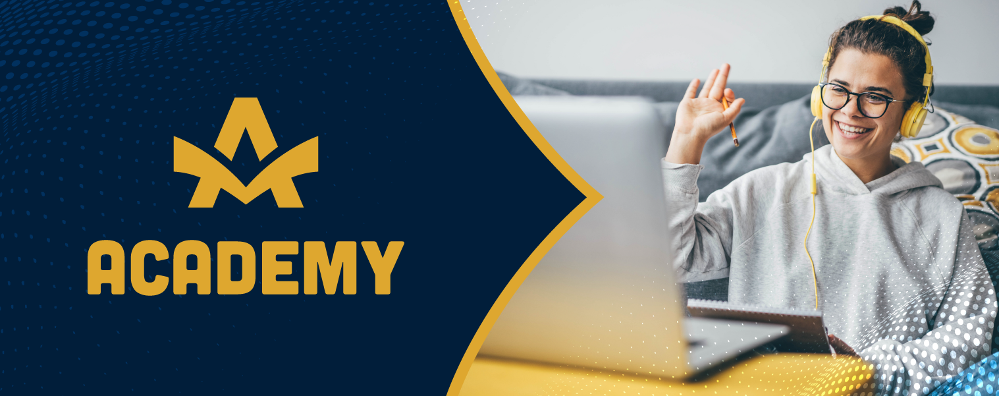

## <font color='blue'>Sommaire</font>

**[Inroduction](#Presentation_projet)**

**[Partie 1 - Importation et Inspection des données](#partie1)**
* [1.1. Importation des librairies](#1_1)
* [1.2. Définition des fonctions](#1_2)
* [1.3. Importation et inspection des données](#1_3)
    * [1.3.1. EdStats country](#1_3_1)
    * [1.3.2. EdStatsCountry-Series](#1_3_2)
    * [1.3.3. EdStatsFootnoote](#1_3_3)
    * [1.3.4. EdStatsSeries](#1_3_4)
    * [1.3.5. EdStatsData](#1_3_5)  
    
**[Partie 2 - Nettoyage et filtrage (pays, indicateurs, années)](#partie2)**
* [2.1. Filtrage préliminaire sur les pays](#2_1)
* [2.2. Filtrage préliminaire sur les indicateurs](#2_2)
* [2.3. Filtrage préliminaire sur les années](#2_3)
* [2.4. Filtrage sur la population et valeurs manquantes (pays et indicateurs)](#2_4)
* [2.5. Récupérer la dernière valeur non null par pays et indicateur](#2_5)

**[Partie 3 - Analyse descriptive et exploratoire](#partie3)**
* [3.1. Distribution des données par indicateurs](#3_1)
* [3.2. Répartition géographique et par groupe de revenus des pays à analyser](#3_2)
* [3.3. Evolution des indicateurs par région et par groupe de revenu](#3_3)
* [3.4. Correlation des indicateurs](#3_4)

**[Partie 4 - Pays avec un fort potentiel de clients](#partie4)**
* [4.1. Calcul d'un score d'attractivité](#4_1)
* [4.2. Analyse des résultats de scoring](#4_2)
* [4.3. Pays cibles](#4_3)
* [4.4. Conclusion et Perspectives](#4_4)

# <font color='blue'>Introduction<a class="anchor" id="Presentation_projet"></a></font>

## Contexte et mission
Academy est une start-up de la EdTech qui propose des contenus de formation en ligne pour un public de niveau lycée et université. 
Dans le cadre de son projet d’expansion à l’international, la mission se décompose en 2 parties : 
- réaliser une analyse exploratoire pour déterminer si les données sur l’éducation de la banque mondiale permettent d’informer le projet d’expansion
- explorer les pays avec un fort potentiel de clients pour les services de academy, et comment ce potentiel pourrait évoluer.

## Données
- Source :  [Organisme “EdStats All Indicator Query” de la Banque mondiale](https://datacatalog.worldbank.org/search/dataset/0038480) - Il répertorie 4 000 indicateurs internationaux décrivant l’accès à l’éducation, l’obtention de diplômes et des informations relatives aux professeurs, aux dépenses liées à l’éducation.
- Jeux de données :
    - EdStatsCountry.csv
    - EdStatsCountry-Series.csv
    - EdStatsData.csv
    - EdStatsFootNote.csv
    - EdStatsSeries.csv
 
 ## Caractéristiques des pays cibles
 En première approche, les critères suivants pour définir les pays cibles :
 - **Accès à Internet et aux technologies** : L'accès à Internet haut débit et à des technologies telles que les ordinateurs est crucial pour l'utilisation de services de formation en ligne.
 - **Population dans la tranche d'âge cible, 15 - 24 ans** : La population de la tranche d'âge cible donne une indication de la taille du marché potentiel.
 - **Scolarisation en secondaire et tertiaire** : Le nombre élèves inscrits dans l'enseignement secondaire et supérieur donne une indication du développement du système éducatif.
 - **Niveau d'alphabétisation** : Un pourcentage élevé de la population capable de lire et d'écrire est souvent un indicateur positif pour la demande de services éducatifs.
 - **Niveau de vie élevé** : la population qui a les moyens de payer des formations en ligne
 - **Dépenses publiques dans l'éducation** : Les pays qui investissent davantage dans l'éducation ont souvent un potentiel plus élevé pour les services de formation en ligne. 
- **Taux de chômage des jeunes** : Les jeunes sont notre public cible clé pour les services de formation en ligne, et un taux de chômage élevé peut les rendre plus enclins à investir dans leur éducation.


# <font color='blue'>Partie 1 - Importation et Inspection des données<a class="anchor" id="partie1"></a></font>

## <font color='green'>1.1. Importation des librairies<a class="anchor" id="1_1"></a></font>

In [1]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno # pour analyser les données manquantes
import plotly
import plotly.express as px
from sklearn.preprocessing import MinMaxScaler 

In [2]:
# Version python
!python --version
# Version des librairies utilisées
print('\n'.join(f'{m.__name__} - {m.__version__}' 
                for m in globals().values() 
                if getattr(m, '__version__', None)))

Python 3.11.4
numpy - 1.26.0
pandas - 2.1.1
matplotlib - 3.8.0
seaborn - 0.13.0
missingno - 0.5.2
plotly - 5.9.0


In [3]:
sns.set_theme(style="white")

In [4]:
# Options d'affichage : toutes les colonnes et toutes les lignes
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [5]:
# Définition des variables des graphiques
fontsize = 12
width = 7
height = 5
figsize = (width, height)
meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'}
textprops_pie = {'fontsize': fontsize, 'color':'white'}
colors_reg = ['#0d0887', '#7201a8', '#781c6d', '#bd3786','#ed6925','#fb9f3a','#f7d13d']
colors_income = ['#440154', '#3e4989', '#26828e', '#35b779', '#b5de2b']#Palette Viridis
colors_country = sns.color_palette('tab10')

## <font color='green'>1.2. Définition des fonctions<a class="anchor" id="1_2"></a></font>

In [6]:
# Fonction pour inspection df
def inspection(df, dfname):
    """!
    @brief Effectue une inspection approfondie du dataframe.

    Cette fonction affiche les premières lignes, les dimensions, les types de variables, 
    les valeurs manquantes, supprime les colonnes vides, identifie les doublons
    et présente une description statistique du dataframe.

    @param df: Dataframe à inspecter (pandas DataFrame).
    @param dfname: Nom du dataframe (str).
    """
    print("*" * 50)
    print(f"Inspection du dataframe {dfname}")
    print("*" * 50)
    print("")
    
    # Affichage des premières lignes du dataframe
    print("Dataframe")
    print("-" * 50)
    display(df.head())
    print("")
    
    # Affichage des dimensions, types de variables et valeurs non-null
    print("Dimensions du dataframe, Types de variables, Valeurs non-null")
    print("-" * 50)
    print(df.info())
    print("")
    
    # Affichage des valeurs manquantes (en pourcentage)
    print("Valeurs manquantes : pourcentage")
    print("-" * 50)
    mean_na = df.isna().mean()
    print(round(mean_na, 2))
    
    # Suppression des colonnes vides le cas échéant
    if max(mean_na) == 1:
        print("")
        print("Suppression des colonnes vides")
        print("-" * 50) 
        print('Dimensions du dataframe avant suppression :', df.shape)
        mean_na = df.isna().mean()
        col_null = list(mean_na[mean_na == 1].index)
        print('Colonne(s) supprimée(s) :', col_null)
        df.drop(columns=col_null, inplace=True)
        print('Dimensions du dataframe après suppression :', df.shape)
        
    print("")
    
    # Affichage des valeurs uniques par colonne
    print("Valeurs uniques par variable")
    print("-" * 50)   
    print(df.nunique())
    print("")
    
    # Identification et affichage des doublons
    print("Nombre de doublons")
    print("-" * 50)   
    print(df.duplicated().sum())
    print("")
    
    # Description statistique du dataframe (moyenne, écart-type, min-max, médiane, IQR)
    print("Description statistique du dataframe")
    print("-" * 50)
    display(df.describe())
    
    # Affichage du graphique des valeurs manquantes (si applicable)
    if sum(df.isna().sum()) > 0:
        print("")
        print("Graphique des valeurs manquantes")
        print("-" * 50)    
        msno.bar(df)
        msno.matrix(df)

In [7]:
def list_filter(df, var, filter_list, TorF):
    """!
    @brief Réalise un filtre sur le dataframe en fonction d'une liste de valeurs.

    Cette fonction filtre le dataframe en fonction des valeurs de la variable spécifiée,
    selon qu'elles sont présentes ou non dans la liste donnée.

    @param df: Dataframe à filtrer (pandas DataFrame).
    @param var: Nom de la variable à laquelle appliquer le filtre (str).
    @param filter_list: Liste des valeurs à utiliser pour le filtre (list).
    @param TorF: True pour inclure les valeurs de filter_list, False pour les exclure (bool).
    @return df_filtered: Dataframe filtré (pandas DataFrame).
    """
    print('Dimensions avant le filtre :', df.shape)
    # Applique le filtre en fonction de TorF (True pour inclure, False pour exclure)
    df_filtered = df.loc[df[var].isin(filter_list) == TorF]
    print('Dimensions après le filtre :', df_filtered.shape)
    
    return df_filtered

In [8]:
def compare_list(liste1, liste2, name_liste1, name_liste2):
    """!
    @brief Compare les éléments présents dans liste1 et non dans liste2 et vice versa.

    Cette fonction compare les éléments présents dans deux listes et affiche les différences.

    @param liste1: Première liste à comparer (list).
    @param liste2: Deuxième liste à comparer (list).
    @param name_liste1: Nom de la première liste (str).
    @param name_liste2: Nom de la deuxième liste (str).
    """
    # Eléments présents dans liste1 mais pas dans liste2
    differences1 = [x for x in liste1 if x not in liste2]
    # Eléments présents dans liste2 mais pas dans liste1
    differences2 = [x for x in liste2 if x not in liste1]
    # Afficher les différences
    print("Eléments présents dans", name_liste1, "mais pas dans", name_liste2, ":", differences1)
    print("Eléments présents dans", name_liste2, "mais pas dans", name_liste1, ":", differences2)

In [9]:
def last_non_null_value(row):
    """!
    @brief Recherche la dernière valeur non null dans une ligne et renvoie le nom de la colonne correspondante.

    Cette fonction parcourt une ligne de données et identifie la dernière valeur non nulle ainsi que 
    le nom de la colonne correspondante.

    @param row: Ligne de données (pandas Series).
    @return last_value: Dernière valeur non null dans la ligne.
    @return column_name: Nom de la colonne correspondante à la dernière valeur non null.
    """
    last_value = None
    column_name = None

    for column in row.index:
        if not pd.isnull(row[column]):
            last_value = row[column]
            column_name = column

    return last_value, column_name

In [10]:
# Fonction pour détecter les outliers
def detectOutlier(data, threshold):
    """!
    @brief Détecte les outliers dans une série de données en utilisant la méthode du z-score.

    Cette fonction identifie les valeurs aberrantes (outliers) dans une série de données en comparant
    les valeurs individuelles à la moyenne et à l'écart-type. Les valeurs au-dessus du seuil spécifié
    sont considérées comme des outliers.

    @param data: Série de données à analyser pour la détection des outliers (pandas Series ou liste).
    @param threshold: Seuil au-dessus duquel le z-score est considéré comme outlier (float, valeur recommandée : [2, 3]).
    @return outliers: Liste des outliers de la variable (list).
    """
    outliers = []  # Crée une liste vide pour stocker les outliers
    mean = np.mean(data)  # Calcul de la moyenne des données
    std = np.std(data)  # Calcul de l'écart-type des données
    
    for i in data:
        if std == 0:
            print('Écart-type nul')
            break
        z_score = (i - mean) / std  # Calcul du z-score pour la valeur i
        if np.abs(z_score) > threshold:  # Valeur absolue du z-score
            outliers.append(i)  # Ajoute i à la liste des outliers
            
    return outliers

In [11]:
def plot_outlier(df, column, res_var1, res_var2):
    """!
    @brief: Visualise la distribution des indicateurs spécifiés dans le dataframe en utilisant des boîtes à moustaches.
        
    Cette fonction génère des graphiques à boîtes pour visualiser la distribution des indicateurs spécifiés dans le 
    dataframe.
    Elle identifie également les outliers pour chaque indicateur et les affiche dans le dataframe de sortie.
    
    @param df : Le dataframe contenant les données à visualiser.
    @param column : Liste des noms de colonnes à visualiser.
    @param res_var1 : Variable de résultat pour le nom de colonne dans le dataframe de sortie.
    @param res_var2 : Variable de résultat pour le nom de colonne dans le dataframe de sortie.
    """
    for col in column:
        plt.figure(figsize=figsize)
        sns.boxplot(data=df, x=col, 
                    orient='h', 
                    showmeans=True, 
                    meanprops=meanprops)
        plt.title("Distribution de l'indicateur "+col, fontsize=fontsize)
        plt.xlabel(col, fontsize=fontsize)
        plt.show()
      
        #Application de la fonction à la série subset
        subset = df[col]
        outliers = detectOutlier(subset,2)
        res=df.loc[df[col].isin(outliers),[res_var1,res_var2,col]].sort_values(col)
        #affichage des outliers détectés
        print()
        print("Nombre d'outliers détectés => " + str(len(outliers)))
        display(res)

In [12]:
def q1(x):
    """!
    @brief Calcule le premier quartile d'une série de données.

    Cette fonction prend une série de données en entrée et retourne le premier quartile (Q1),
    qui représente la valeur en-dessous de laquelle 25% des données se situent.

    @param x: Série de données (pandas Series).
    @return x.quantile(0.25): Premier quartile de la série x.
    """

    return x.quantile(0.25)

def q3(x):
    """!
    @brief Calcule le troisième quartile d'une série de données.

    Cette fonction prend une série de données en entrée et retourne le troisième quartile (Q3),
    qui représente la valeur en-dessous de laquelle 75% des données se situent.

    @param x: Série de données (pandas Series).
    @return x.quantile(0.75): Troisième quartile de la série x.
    """

    return x.quantile(0.75)

In [13]:
def stats(df, indicator, var, colors):
    """!
    @brief Affiche pour chaque indicateur une table avec les statistiques et un boxplot par modalité de la variable.

    Cette fonction génère une table contenant les statistiques des indicateurs et affiche un boxplot pour chaque indicateur,
    regroupé par modalité de la variable spécifiée.

    @param df: Dataframe contenant les données (pandas DataFrame).
    @param indicator: Liste contenant les noms des indicateurs à analyser (list de str).
    @param var: Variable utilisée pour le regroupement (str).
    @param colors: Liste des couleurs à utiliser pour le graphique (list de str).
    """

    # Statistiques descriptives à afficher
    stats = ['mean', 'std', 'min', q1, 'median', q3, 'max']
    # Caractéristiques d'affichage de meanprops
    meanprops = {'marker':'o', 'markeredgecolor':'black', 'markerfacecolor':'firebrick'}

    # Boucle pour afficher pour chaque indicateur : une table avec les statistiques et un boxplot par région
    for ind in indicator:
        # Affichage des statistiques sous forme de table
        display(df.groupby(var).agg({ind: stats}))

        # Création et affichage du boxplot
        plt.figure(figsize=figsize)
        sns.boxplot(data=df.sort_values(var), 
                    x=ind, 
                    y=var, 
                    hue=var, 
                    showfliers=False, 
                    showmeans=True, 
                    meanprops=meanprops,
                    palette=colors)
        plt.title(ind+" : Distribution par "+var,fontsize=fontsize)
        plt.show()

In [14]:
def evol_indicator(df, var, modalites, ind_list, colors, nb_cols):
    """!
    @brief Affiche l'évolution des indicateurs pour chaque modalité de la variable 'var' sous forme de graphiques.

    Cette fonction regroupe les données par modalité de la variable 'var' et affiche l'évolution des indicateurs
    spécifiés pour chaque modalité.

    @param df: Dataframe contenant les données (pandas DataFrame).
    @param var: Variable utilisée pour le regroupement (str).
    @param modalites: Liste des modalités à représenter pour chaque indicateur (list de str).
    @param ind_list: Liste contenant les indicateurs à analyser (list de str).
    @param colors: Liste des couleurs à utiliser pour les graphiques (list de str).
    @param nb_cols: Nombre de graphiques par colonne (int, valeur par défaut : 1).
    """

    # Calcul du nombre de graphiques à afficher et de lignes nécessaires
    nb_plots = len(ind_list)
    nb_rows = -(-nb_plots // nb_cols) 

    # Création de la figure et des axes pour les graphiques
    fig, axs = plt.subplots(nb_rows, nb_cols, figsize=(width* nb_cols, height* nb_rows), squeeze=False)

    # Boucle pour créer et afficher les graphiques
    for i, ind in enumerate(ind_list):
        row = i // nb_cols
        col = i % nb_cols
        ax = axs[row, col]
        for modalite, color in zip(modalites, colors):
            df_mod = df.loc[df[var] == modalite]
            ax.plot(df_mod['Année'], df_mod[ind], color=color)
        
        # Obtenir le nom de l'indicateur à partir de series_df
        ylabel = series_df.loc[series_df['SeriesCode'] == ind, 'IndicatorName'].iloc[0]
        
        # Configuration des axes et des légendes
        ax.set_title('Évolution de ' + str(ind), fontsize=fontsize)
        ax.legend(labels=modalites, fontsize=fontsize)
        ax.set_xlabel('Année', fontsize=fontsize)
        ax.set_ylabel(ylabel, multialignment='center', wrap=True, fontsize=fontsize)
        ax.grid()

        # Masquer les graphiques vides (s'il y en a)
        for j in range(nb_plots, nb_rows * nb_cols):
            axs[j // nb_cols, j % nb_cols].axis('off')
    
    plt.tight_layout()
    plt.show()

In [15]:
def group_indicator(df, var, ind_list, year, colors, graphs_per_row):
    """!
    @brief Groupe les données par année, région et indicateur, puis affiche l'évolution des indicateurs
    spécifiés pour chaque modalité de la variable 'var'.

    Cette fonction groupe les données par année, région et indicateur, puis affiche l'évolution des indicateurs
    spécifiés pour chaque modalité de la variable 'var'.

    @param df: Dataframe contenant les données (pandas DataFrame).
    @param var: Variable utilisée pour le regroupement (str).
    @param ind_list: Liste contenant les noms des indicateurs à analyser (list de str).
    @param year: Liste des années présentes dans le dataframe df (list de str ou int).
    @param colors: Liste des couleurs à utiliser pour les graphiques (list de str).
    """
    
    # Regroupement des données par année, région et indicateur, puis création du dataframe groupé
    df_group = df.groupby([var, 'IndicatorCode'])[year].mean().reset_index() \
                 .melt(id_vars=[var, 'IndicatorCode'],
                       var_name='Année',
                       value_name='Valeur') \
                 .pivot(index=[var, 'Année'],
                        columns='IndicatorCode',
                        values='Valeur').reset_index()

    # Liste des modalités prises par la variable 'var'
    modalites = list(df_group[var].unique())
    # Liste des indicateurs à analyser
    indicators = ind_list
    # Liste des couleurs à utiliser pour les graphiques
    color_plot = colors
    # Variable à afficher sur l'axe des x dans les graphiques
    features = var
    # Nombre de graphes par ligne
    nb_cols = graphs_per_row
    
    # Affiche l'évolution des indicateurs en utilisant la fonction evol_indicator
    evol_indicator(df_group, features, modalites, indicators, color_plot, nb_cols)

In [16]:
def top_country(df, top_list, ind_list, year, colors, graphs_per_row):
    """!
    @brief Affiche l'évolution des indicateurs pour les pays du top classement spécifié.

    Cette fonction sélectionne les données des indicateurs pour les pays du top classement,
    interpole les valeurs manquantes, puis affiche l'évolution des indicateurs spécifiés
    pour chaque pays du top classement.

    @param df : Dataframe contenant les données (pandas DataFrame).
    @param top_list : Liste des codes des pays du top classement (list de str).
    @param ind_list : Liste contenant les noms des indicateurs à analyser (list de str).
    @param year : Liste des années présentes dans le dataframe df (list de str ou int).
    @param colors : Liste des couleurs à utiliser pour les graphiques (list de str).
    """
    
    # Sélection des données des indicateurs pour les pays du top classement
    select = ['CountryName', 'CountryCode', 'Region', 'IncomeGroup', 'IndicatorCode'] + year
    df_top = df[select].loc[df['CountryCode'].isin(top_list)]
    
    # Interpolation des valeurs manquantes dans les données des indicateurs
    df_top[year] = df_top[year].interpolate(method='linear', axis=1)
    
    # Restructuration des données pour l'affichage des indicateurs
    df_top = df_top.melt(id_vars=['CountryName', 'CountryCode', 'Region', 'IncomeGroup', 'IndicatorCode'],
                         var_name='Année',
                         value_name='Valeur') \
                   .pivot(index=['CountryName', 'CountryCode', 'Region', 'IncomeGroup', 'Année'],
                          columns='IndicatorCode',
                          values='Valeur').reset_index()
    
    # Noms des pays stockés dans labels
    labels = list(df_top['CountryName'].sort_values().unique())
    
    # Liste des modalités (pays) à afficher sur l'axe des x dans les graphiques
    modalites = labels
    # Liste des indicateurs à analyser
    indicators = ind_list
    # Liste des couleurs à utiliser pour les graphiques
    color_plot = colors 
    # Nombre de graphes par ligne
    nb_cols = graphs_per_row
    
    # Affiche l'évolution des indicateurs en utilisant la fonction evol_indicator
    evol_indicator(df_top, 'CountryName', modalites, indicators, color_plot, nb_cols)

## <font color='green'>1.3. Importation et inspection des données<a class="anchor" id="1_3"></a></font>

### 1.3.1. EdStats country<a class="anchor" id="1_3_1">

**************************************************
Inspection du dataframe EdStats country
**************************************************

Dataframe
--------------------------------------------------


,Country Code,Short Name,Table Name,Long Name,2-alpha code,Currency Unit,Special Notes,Region,Income Group,WB-2 code,National accounts base year,National accounts reference year,SNA price valuation,Lending category,Other groups,System of National Accounts,Alternative conversion factor,PPP survey year,Balance of Payments Manual in use,External debt Reporting status,System of trade,Government Accounting concept,IMF data dissemination standard,Latest population census,Latest household survey,Source of most recent Income and expenditure data,Vital registration complete,Latest agricultural census,Latest industrial data,Latest trade data,Latest water withdrawal data,Unnamed: 31
0,ABW,Aruba,Aruba,Aruba,AW,Aruban florin,SNA data for 2000-2011 are updated from offici...,Latin America & Caribbean,High income: nonOECD,AW,2000,NaN,Value added at basic prices (VAB),NaN,NaN,Country uses the 1993 System of National Accou...,NaN,NaN,"IMF Balance of Payments Manual, 6th edition.",NaN,Special trade system,NaN,NaN,2010,NaN,NaN,Yes,NaN,NaN,2012.0,NaN,NaN
1,AFG,Afghanistan,Afghanistan,Islamic State of Afghanistan,AF,Afghan afghani,Fiscal year end: March 20; reporting period fo...,South Asia,Low income,AF,2002/03,NaN,Value added at basic prices (VAB),IDA,HIPC,Country uses the 1993 System of National Accou...,NaN,NaN,NaN,Actual,General trade system,Consolidated central government,General Data Dissemination System (GDDS),1979,"Multiple Indicator Cluster Survey (MICS), 2010/11","Integrated household survey (IHS), 2008",NaN,2013/14,NaN,2012.0,2000,NaN
2,AGO,Angola,Angola,People's Republic of Angola,AO,Angolan kwanza,"April 2013 database update: Based on IMF data,...",Sub-Saharan Africa,Upper middle income,AO,2002,NaN,Value added at producer prices (VAP),IBRD,NaN,Country uses the 1993 System of National Accou...,1991–96,2005,"IMF Balance of Payments Manual, 6th edition.",Actual,Special trade system,Budgetary central government,General Data Dissemination System (GDDS),1970,"Malaria Indicator Survey (MIS), 2011","Integrated household survey (IHS), 2008",NaN,2015,NaN,NaN,2005,NaN
3,ALB,Albania,Albania,Republic of Albania,AL,Albanian lek,NaN,Europe & Central Asia,Upper middle income,AL,Original chained constant price data are resca...,1996.0,Value added at basic prices (VAB),IBRD,NaN,Country uses the 1993 System of National Accou...,NaN,Rolling,"IMF Balance of Payments Manual, 6th edition.",Actual,General trade system,Budgetary central government,General Data Dissemination System (GDDS),2011,"Demographic and Health Survey (DHS), 2008/09",Living Standards Measurement Study Survey (LSM...,Yes,2012,2010.0,2012.0,2006,NaN
4,AND,Andorra,Andorra,Principality of Andorra,AD,Euro,NaN,Europe & Central Asia,High income: nonOECD,AD,1990,NaN,NaN,NaN,NaN,Country uses the 1968 System of National Accou...,NaN,NaN,NaN,NaN,Special trade system,NaN,NaN,2011. Population figures compiled from adminis...,NaN,NaN,Yes,NaN,NaN,2006.0,NaN,NaN



Dimensions du dataframe, Types de variables, Valeurs non-null
--------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 241 entries, 0 to 240
Data columns (total 32 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   Country Code                                       241 non-null    object 
 1   Short Name                                         241 non-null    object 
 2   Table Name                                         241 non-null    object 
 3   Long Name                                          241 non-null    object 
 4   2-alpha code                                       238 non-null    object 
 5   Currency Unit                                      215 non-null    object 
 6   Special Notes                                      145 non-null    object 
 7   Region                                             214 n

,National accounts reference year,Latest industrial data,Latest trade data
count,32.00000,107.000000,185.000000
mean,2001.53125,2008.102804,2010.994595
std,5.24856,2.616834,2.569675
min,1987.00000,2000.000000,1995.000000
25%,1996.75000,2007.500000,2011.000000
50%,2002.00000,2009.000000,2012.000000
75%,2005.00000,2010.000000,2012.000000
max,2012.00000,2010.000000,2012.000000



Graphique des valeurs manquantes
--------------------------------------------------


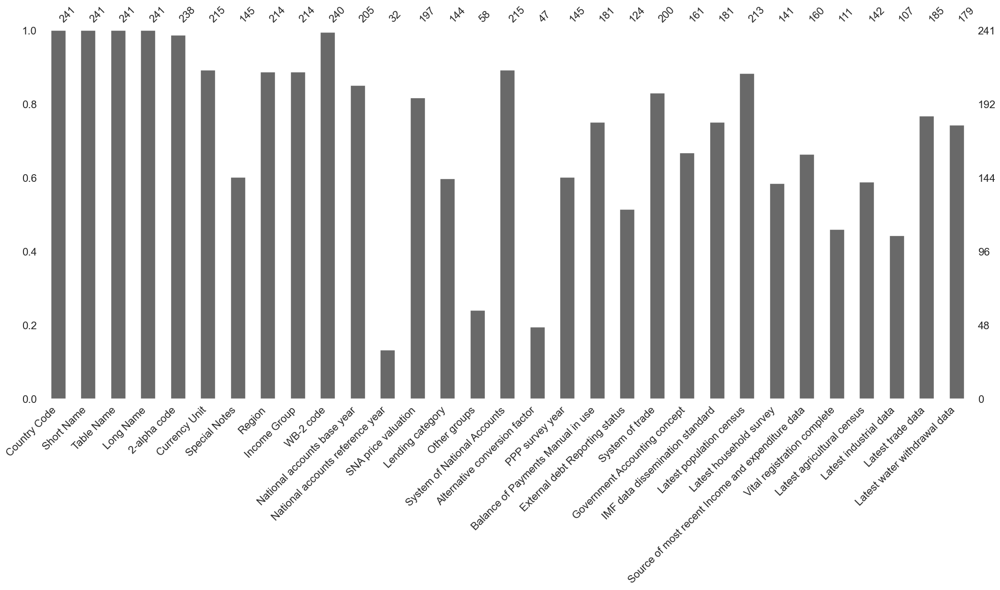

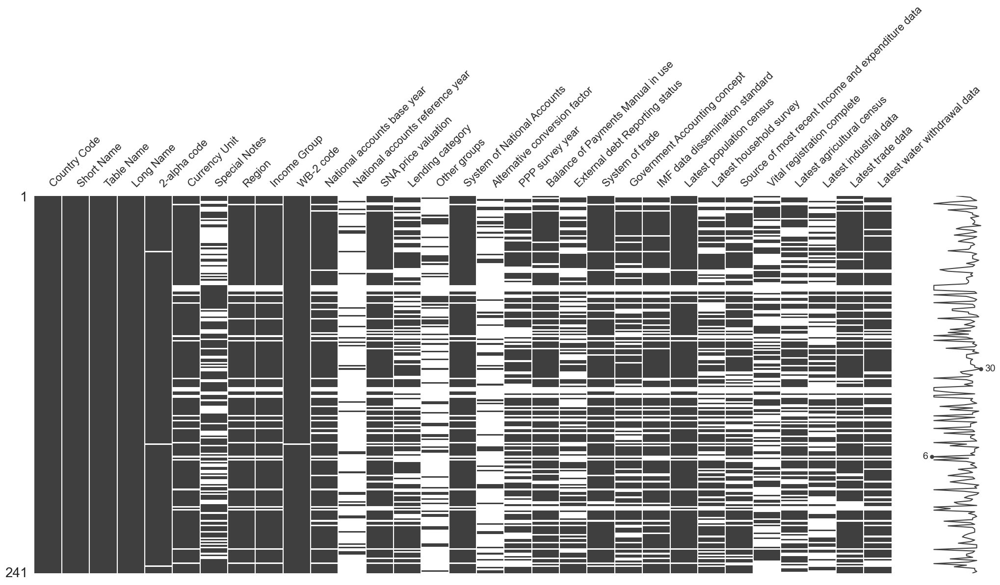

In [17]:
# Importation et aperçu du data frame
country=pd.read_csv('EdStatsCountry.csv')
inspection(country, "EdStats country")

***Unicité de la clé primaire***

In [18]:
# La clé 'Country code' doit être unique
country.loc[country['Country Code'].duplicated(keep=False),:]

,Country Code,Short Name,Table Name,Long Name,2-alpha code,Currency Unit,Special Notes,Region,Income Group,WB-2 code,National accounts base year,National accounts reference year,SNA price valuation,Lending category,Other groups,System of National Accounts,Alternative conversion factor,PPP survey year,Balance of Payments Manual in use,External debt Reporting status,System of trade,Government Accounting concept,IMF data dissemination standard,Latest population census,Latest household survey,Source of most recent Income and expenditure data,Vital registration complete,Latest agricultural census,Latest industrial data,Latest trade data,Latest water withdrawal data


**Première analyse :**

Ce Dataframe contient 241 pays listés avec région et income group et diverses informations sur les sources des données et les dates des dernières données.
 - Les variables : 
    - **Country code** : code du pays, 241 pays uniques
    - **Short Name / Table Name / Long name** : nom du pays
    - **Region** : région géographique du pays, 7 régions
    - **Income group** : groupe de revenu du pays, 5 groupes de revenus
    - **2-alpha Code** et **WB2 Code** : autres codes du pays qui pourraient être utiles pour des représentations sur des maps.
- Type de variables : incorrect pour les années
- Beaucoup de valeurs manquantes et dernière colonne `Unnamed: 31` vide
- Clé primaire : `Country code`

### 1.3.2. EdStatsCountry-Series<a class="anchor" id="1_3_2">

In [19]:
# Importation et aperçu du data frame
cseries=pd.read_csv('EdStatsCountry-Series.csv')
inspection(cseries, 'EdStatsCountry-Series')

**************************************************
Inspection du dataframe EdStatsCountry-Series
**************************************************

Dataframe
--------------------------------------------------


,CountryCode,SeriesCode,DESCRIPTION,Unnamed: 3
0,ABW,SP.POP.TOTL,Data sources : United Nations World Population...,NaN
1,ABW,SP.POP.GROW,Data sources: United Nations World Population ...,NaN
2,AFG,SP.POP.GROW,Data sources: United Nations World Population ...,NaN
3,AFG,NY.GDP.PCAP.PP.CD,Estimates are based on regression.,NaN
4,AFG,SP.POP.TOTL,Data sources : United Nations World Population...,NaN



Dimensions du dataframe, Types de variables, Valeurs non-null
--------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 613 entries, 0 to 612
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   CountryCode  613 non-null    object 
 1   SeriesCode   613 non-null    object 
 2   DESCRIPTION  613 non-null    object 
 3   Unnamed: 3   0 non-null      float64
dtypes: float64(1), object(3)
memory usage: 19.3+ KB
None

Valeurs manquantes : pourcentage
--------------------------------------------------
CountryCode    0.0
SeriesCode     0.0
DESCRIPTION    0.0
Unnamed: 3     1.0
dtype: float64

Suppression des colonnes vides
--------------------------------------------------
Dimensions du dataframe avant suppression : (613, 4)
Colonne(s) supprimée(s) : ['Unnamed: 3']
Dimensions du dataframe après suppression : (613, 3)

Valeurs uniques par variable
------------------------------------

,CountryCode,SeriesCode,DESCRIPTION
count,613,613,613
unique,211,21,97
top,MDA,SP.POP.TOTL,Data sources : United Nations World Population...
freq,18,211,154


***Unicité de la clé primaire***

In [20]:
# La clé 'Country code/ISeries Code' doit être unique
cseries.loc[cseries[['CountryCode','SeriesCode']].duplicated(keep=False),:]

,CountryCode,SeriesCode,DESCRIPTION


La clé primaire est unique.

**Première analyse :**

Ce dataframe liste des sources des séries de données par pays et par indicateur
 - Variables:
    - **Country code** : code du pays, 211 pays uniques
    - **Series code** : code de la serie, 21 indicateurs uniques
    - **Description** : source de la donnée ou des informations sur la donnée
- Colonne `Unnamed: 3` vide 
- Clé primaire: `CountryCode` & `SeriesCode`

### 1.3.3. EdStatsFootNote<a class="anchor" id="1_3_3">

In [21]:
# Importation et aperçu du data frame
footnote=pd.read_csv('EdStatsFootNote.csv')
inspection(footnote, 'EdStatsFootNote')

**************************************************
Inspection du dataframe EdStatsFootNote
**************************************************

Dataframe
--------------------------------------------------


,CountryCode,SeriesCode,Year,DESCRIPTION,Unnamed: 4
0,ABW,SE.PRE.ENRL.FE,YR2001,Country estimation.,NaN
1,ABW,SE.TER.TCHR.FE,YR2005,Country estimation.,NaN
2,ABW,SE.PRE.TCHR.FE,YR2000,Country estimation.,NaN
3,ABW,SE.SEC.ENRL.GC,YR2004,Country estimation.,NaN
4,ABW,SE.PRE.TCHR,YR2006,Country estimation.,NaN



Dimensions du dataframe, Types de variables, Valeurs non-null
--------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 643638 entries, 0 to 643637
Data columns (total 5 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   CountryCode  643638 non-null  object 
 1   SeriesCode   643638 non-null  object 
 2   Year         643638 non-null  object 
 3   DESCRIPTION  643638 non-null  object 
 4   Unnamed: 4   0 non-null       float64
dtypes: float64(1), object(4)
memory usage: 24.6+ MB
None

Valeurs manquantes : pourcentage
--------------------------------------------------
CountryCode    0.0
SeriesCode     0.0
Year           0.0
DESCRIPTION    0.0
Unnamed: 4     1.0
dtype: float64

Suppression des colonnes vides
--------------------------------------------------
Dimensions du dataframe avant suppression : (643638, 5)
Colonne(s) supprimée(s) : ['Unnamed: 4']
Dimensions du dataframe après suppression 

,CountryCode,SeriesCode,Year,DESCRIPTION
count,643638,643638,643638,643638
unique,239,1558,56,9102
top,LIC,SH.DYN.MORT,YR2004,Country Data
freq,7320,9226,27128,191188


***Unicité de la clé primaire***

In [22]:
# La clé 'CountryCode/SeriesCode'/'Year' doit être unique
footnote.loc[footnote[['CountryCode','SeriesCode', 'Year']].duplicated(keep=False),:]

,CountryCode,SeriesCode,Year,DESCRIPTION


La clé primaire est unique.

**Première analyse :**

Ce dataframe indique pour chaque pays, chaque indicateur et chaque année quelle est la source de la valeur de l'indicateur.
- Variables :
    - **CountryCode** : code du pays, 239 pays uniques
    - **SeriesCode** : code de l'indicateur, 1558 indicateurs uniques
    - **Year** : Année, 56 années uniques
    - **DESCRIPTION** : source de la données
- La dernière colonne `Unnnamed:4` est une colonne vide.
- Le type de variable est incorrect pour `Year` -> cela devrait être Date (ex: YR2000 -> 2000).
- Clé primaire : `Country Code` & `Series Code` & `Year`

### 1.3.4. EdStatsSeries<a class="anchor" id="1_3_4">

**************************************************
Inspection du dataframe EdStatsSeries
**************************************************

Dataframe
--------------------------------------------------


,Series Code,Topic,Indicator Name,Short definition,Long definition,Unit of measure,Periodicity,Base Period,Other notes,Aggregation method,Limitations and exceptions,Notes from original source,General comments,Source,Statistical concept and methodology,Development relevance,Related source links,Other web links,Related indicators,License Type,Unnamed: 20
0,BAR.NOED.1519.FE.ZS,Attainment,Barro-Lee: Percentage of female population age...,Percentage of female population age 15-19 with...,Percentage of female population age 15-19 with...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,BAR.NOED.1519.ZS,Attainment,Barro-Lee: Percentage of population age 15-19 ...,Percentage of population age 15-19 with no edu...,Percentage of population age 15-19 with no edu...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,BAR.NOED.15UP.FE.ZS,Attainment,Barro-Lee: Percentage of female population age...,Percentage of female population age 15+ with n...,Percentage of female population age 15+ with n...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,BAR.NOED.15UP.ZS,Attainment,Barro-Lee: Percentage of population age 15+ wi...,Percentage of population age 15+ with no educa...,Percentage of population age 15+ with no educa...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,BAR.NOED.2024.FE.ZS,Attainment,Barro-Lee: Percentage of female population age...,Percentage of female population age 20-24 with...,Percentage of female population age 20-24 with...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN



Dimensions du dataframe, Types de variables, Valeurs non-null
--------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3665 entries, 0 to 3664
Data columns (total 21 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Series Code                          3665 non-null   object 
 1   Topic                                3665 non-null   object 
 2   Indicator Name                       3665 non-null   object 
 3   Short definition                     2156 non-null   object 
 4   Long definition                      3665 non-null   object 
 5   Unit of measure                      0 non-null      float64
 6   Periodicity                          99 non-null     object 
 7   Base Period                          314 non-null    object 
 8   Other notes                          552 non-null    object 
 9   Aggregation method                   47 non-null

,Series Code,Topic,Indicator Name,Short definition,Long definition,Periodicity,Base Period,Other notes,Aggregation method,Limitations and exceptions,General comments,Source,Statistical concept and methodology,Development relevance,Related source links
count,3665,3665,3665,2156,3665,99,314,552,47,14,14,3665,23,3,215
unique,3665,37,3665,1169,2060,1,4,14,3,9,8,31,2,1,1
top,BAR.NOED.1519.FE.ZS,Learning Outcomes,Barro-Lee: Percentage of female population age...,Data Interpretation: 1=Latent; 2=Emerging; 3=E...,Data Interpretation: 1=Latent; 2=Emerging; 3=E...,Annual,Projections (2010 to 2100),EGRA,Weighted average,Data should be used cautiously because of diff...,When NEET rates are available for more than tw...,UNESCO Institute for Statistics,TIMSS,Unemployment and total employment are the broa...,http://saber.worldbank.org/index.cfm
freq,1,1046,1,215,215,99,308,403,31,3,3,1269,20,3,215



Graphique des valeurs manquantes
--------------------------------------------------


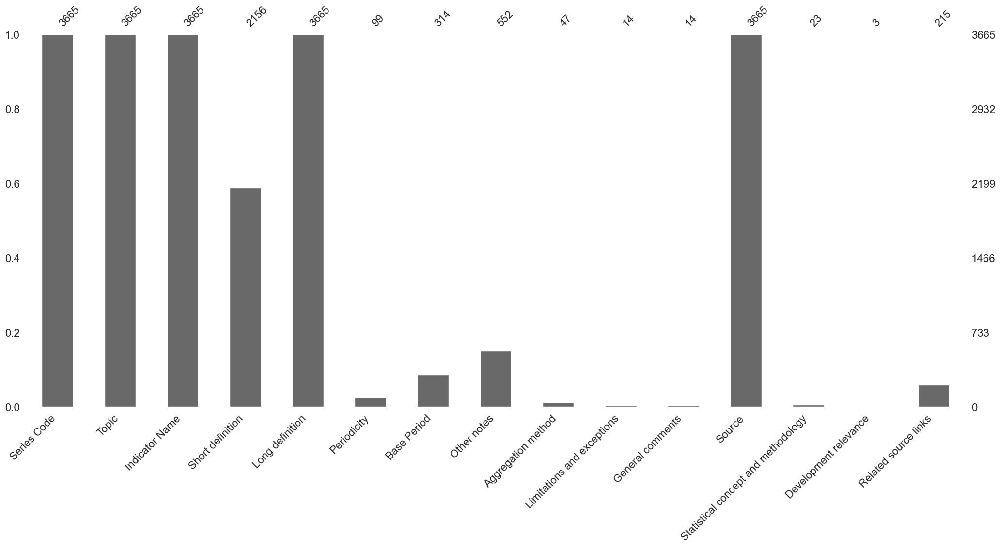

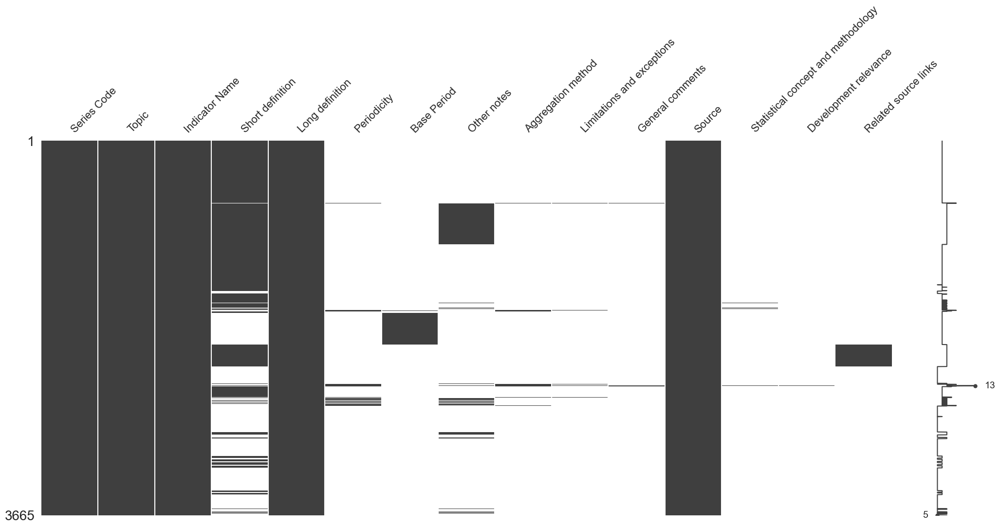

In [23]:
# Importation et aperçu du data frame
series=pd.read_csv('EdStatsSeries.csv')
inspection(series, 'EdStatsSeries')

***Unicité de la clé primaire***

In [24]:
# La clé 'CountryCode/SeriesCode'/'Year' doit être unique
series.loc[series['Series Code'].duplicated(keep=False),:]

,Series Code,Topic,Indicator Name,Short definition,Long definition,Periodicity,Base Period,Other notes,Aggregation method,Limitations and exceptions,General comments,Source,Statistical concept and methodology,Development relevance,Related source links


La clé primaire est unique.

**Première analyse :**

Ce dataframe liste pour chaque indicateurs : son code, son topic, sa définition et sa source 
- Variables :
    - **Series Code** : code de l'indicateur, 3665 indicateurs uniques
    - **Topic** : thème de l'indicateur, 37 topics
    - **Indicator Name** : nom de l'indicateur
    - **Long definition** : définition de l'indicateur
    - **Source** : source de l'indicateur
- Il y a un fort taux de valeurs manquantes pour plusieurs colonnes (>0.8%) : ces colonnes ne seront pas conservées.
    - Les colonnes `Unit of measure`, `Notes from original source`, `Other web links`, `Related indicators`, `License Type`, `Unnamed: 20` sont vides.
    - Les colonnes `Periodicity`, `Base Period`, `Other notes`, `Aggregation method`, `Limitations and exceptions`, `General comments`,`Statistical concept and methodology`, `Development relevance`, `Related source links` contiennent entre 80 à 99% de valeurs manquantes.
- Clé primaire : `Series Code`

### 1.3.5. EdStatsData<a class="anchor" id="1_3_5">

**************************************************
Inspection du dataframe EdStatsData
**************************************************

Dataframe
--------------------------------------------------


,Country Name,Country Code,Indicator Name,Indicator Code,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2020,2025,2030,2035,2040,2045,2050,2055,2060,2065,2070,2075,2080,2085,2090,2095,2100,Unnamed: 69
0,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.F,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.GPI,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.M,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Arab World,ARB,"Adjusted net enrolment rate, primary, both sex...",SE.PRM.TENR,54.822121,54.894138,56.209438,57.267109,57.991138,59.36554,60.999962,61.92268,62.69342,64.383186,65.617767,66.085152,66.608139,67.290451,68.510094,69.033211,69.944908,71.04187,71.693779,71.699097,71.995819,72.602837,70.032722,70.464821,72.645683,71.81176,73.903511,74.425201,75.110817,76.254318,77.245682,78.800522,80.051399,80.805389,81.607063,82.489487,82.685509,83.280342,84.011871,84.195961,85.211998,85.24514,86.101669,85.51194,85.320152,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN



Dimensions du dataframe, Types de variables, Valeurs non-null
--------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 886930 entries, 0 to 886929
Data columns (total 70 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Country Name    886930 non-null  object 
 1   Country Code    886930 non-null  object 
 2   Indicator Name  886930 non-null  object 
 3   Indicator Code  886930 non-null  object 
 4   1970            72288 non-null   float64
 5   1971            35537 non-null   float64
 6   1972            35619 non-null   float64
 7   1973            35545 non-null   float64
 8   1974            35730 non-null   float64
 9   1975            87306 non-null   float64
 10  1976            37483 non-null   float64
 11  1977            37574 non-null   float64
 12  1978            37576 non-null   float64
 13  1979            36809 non-null   float64
 14  1980            89122 non-null   f

,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2020,2025,2030,2035,2040,2045,2050,2055,2060,2065,2070,2075,2080,2085,2090,2095,2100
count,7.228800e+04,3.553700e+04,3.561900e+04,3.554500e+04,3.573000e+04,8.730600e+04,3.748300e+04,3.757400e+04,3.757600e+04,3.680900e+04,8.912200e+04,3.877700e+04,3.751100e+04,3.846000e+04,3.860600e+04,9.029600e+04,3.937200e+04,3.864100e+04,3.855200e+04,3.754000e+04,1.244050e+05,7.443700e+04,7.554300e+04,7.579300e+04,7.746200e+04,1.313610e+05,7.680700e+04,7.345300e+04,8.491400e+04,1.188390e+05,1.766760e+05,1.235090e+05,1.242050e+05,1.303630e+05,1.288140e+05,1.841080e+05,1.403120e+05,1.372720e+05,1.343870e+05,1.421080e+05,2.424420e+05,1.460120e+05,1.472640e+05,1.375090e+05,1.137890e+05,1.310580e+05,1.646000e+04,143.000000,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04
mean,1.974772e+09,4.253638e+09,4.592365e+09,5.105006e+09,5.401493e+09,2.314288e+09,5.731808e+09,6.124437e+09,6.671489e+09,7.436724e+09,3.283898e+09,7.664969e+09,7.913722e+09,7.856908e+09,8.118002e+09,3.622763e+09,9.156550e+09,1.014901e+10,1.104709e+10,1.195436e+10,9.084424e+09,1.571674e+10,1.604668e+10,1.643532e+10,1.684022e+10,1.052543e+10,1.874630e+10,2.027385e+10,1.794678e+10,1.331558e+10,9.423384e+09,1.384867e+10,1.428299e+10,1.449393e+10,1.589729e+10,1.188637e+10,1.684674e+10,1.872300e+10,2.029794e+10,1.894907e+10,1.189592e+10,2.117911e+10,2.176323e+10,2.425332e+10,2.678449e+10,2.353720e+10,1.934411e+11,2.160839,5.780697e+02,6.054774e+02,6.315916e+02,6.556516e+02,6.751516e+02,6.911287e+02,7.040640e+02,7.145788e+02,7.224868e+02,7.271290e+02,7.283779e+02,7.266484e+02,7.228327e+02,7.176899e+02,7.113072e+02,7.034274e+02,6.940296e+02
std,1.211687e+11,1.804814e+11,1.914083e+11,2.059170e+11,2.112150e+11,1.375059e+11,2.215546e+11,2.325489e+11,2.473986e+11,2.660957e+11,1.780774e+11,2.744142e+11,2.790549e+11,2.823809e+11,2.940635e+11,2.002929e+11,3.264675e+11,3.535351e+11,3.804257e+11,4.014873e+11,3.665667e+11,4.881357e+11,5.012055e+11,5.121962e+11,5.292982e+11,4.285218e+11,5.812586e+11,6.142357e+11,5.859148e+11,5.153472e+11,4.442374e+11,5.449242e+11,5.622886e+11,5.803607e+11,6.278337e+11,5.576181e+11,6.851484e+11,7.465688e+11,7.944132e+11,7.623650e+11,6.218710e+11,8.555853e+11,8.833955e+11,9.513016e+11,1.023180e+12,9.732465e+11,2.839188e+12,0.810584,1.475072e+04,1.577305e+04,1.678556e+04,1.778666e+04,1.874408e+04,1.965409e+04,2.052941e+04,2.136851e+04,2.215845e+04,2.287990e+04,2.352338e+04,2.408149e+04,2.455897e+04,2.496587e+04,2.530183e+04,2.556069e+04,2.574189e+04
min,-1.435564e+00,-1.594625e+00,-3.056522e+00,-4.032582e+00,-4.213563e+00,-3.658569e+00,-2.950945e+00,-3.174870e+00,-3.558749e+00,-2.973612e+00,-1.404240e+00,-1.478345e+00,-2.358765e+00,-2.867273e+00,-2.800548e+00,-2.216315e+00,-1.556722e+00,-1.410886e+00,-1.425202e+00,-1.562425e+00,-1.803750e+00,-5.814339e+00,-5.089333e+00,-6.184857e+00,-4.792691e+00,-2.697722e+00,-3.820174e+00,-2.517245e+00,-6.086200e+04,-6.526000e+04,-6.759300e+04,-6.973700e+04,-9.214300e+04,-1.111860e+05,-1.262600e+05,-1.347240e+05,-3.708940e+05,-3.882170e+05,-4.088540e+05,-4.561240e+05,-4.969050e+05,-5.709940e+05,-6.049930e+05,-6.157480e+05,-8.900000e+01,-2.467847e+00,-1.797539e+00,1.000000,-1.870000e+00,-2.000000e+00,-2.110000e+00,-2.150000e+00,-2.140000e+00,-2.090000e+00,-1.980000e+00,-1.830000e+00,-1.630000e+00,-1.440000e+00,-1.260000e+00,-1.090000e+00,-9.200000e-01,-7.800000e-01,-6.500000e-01,-5.500000e-01,-4.500000e-01
25%,8.900000e-01,8.853210e+00,9.240920e+00,9.595200e+00,9.861595e+00,1.400000e+00,9.312615e+00,9.519913e+00,1.000000e+01,1.000000e+01,1.770000e+00,9.468690e+00,9.989330e+00,9.581825e+00,9.068048e+00,2.150000e+00,9.332923e+00,


Graphique des valeurs manquantes
--------------------------------------------------


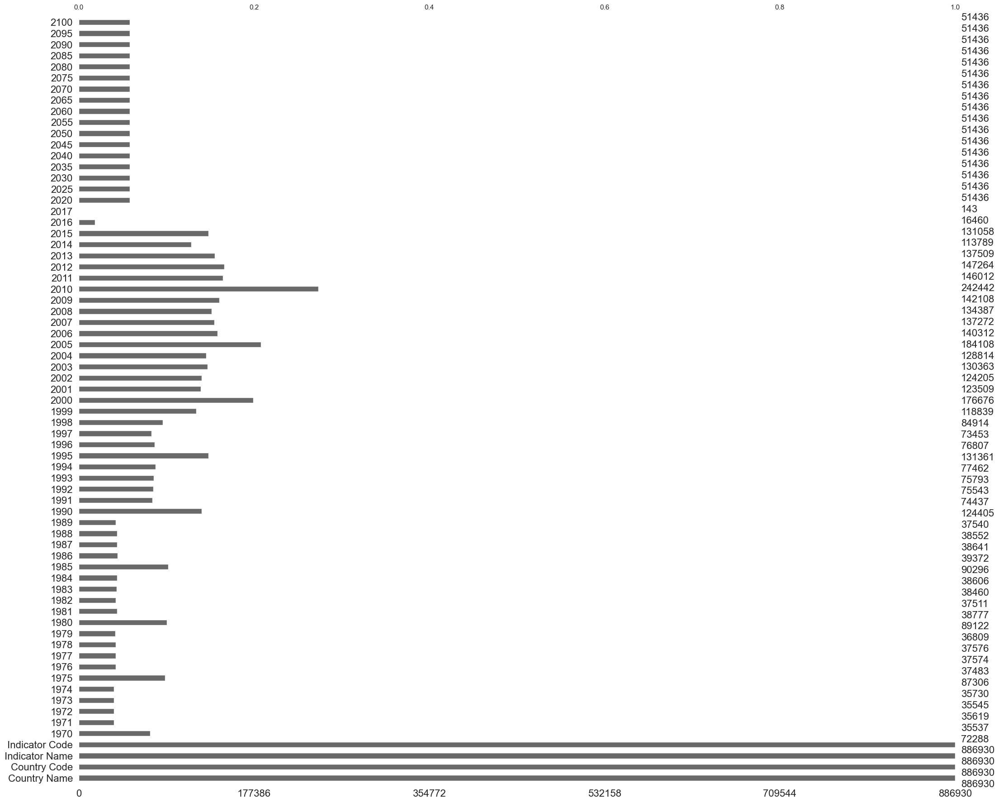

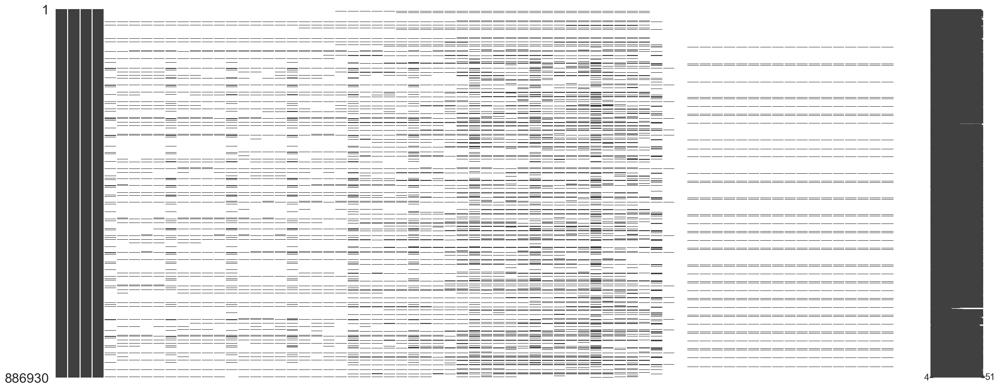

In [25]:
# Importation et aperçu du data frame
data=pd.read_csv('EdStatsData.csv')
inspection(data, 'EdStatsData')

***Unicité de la clé primaire***

In [26]:
# La clé 'Country code/Indicator Code' doit être unique
data.loc[data[['Country Code','Indicator Code']].duplicated(keep=False),:]

,Country Name,Country Code,Indicator Name,Indicator Code,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2020,2025,2030,2035,2040,2045,2050,2055,2060,2065,2070,2075,2080,2085,2090,2095,2100


La clé primaire est unique.

**Première analyse :** : 

Ce dataframe contient par pays et par indicateur, les valeurs des indicateurs pour différentes années allant 1970 à 2100.
- Variables : 
    - **Country Name** : nom du pays
    - **Country Code** : code du pays, 242 pays uniques
    - **Indicator Name** : nom de l'indicateur, 3665 indicateurs uniques
    - **Indicator Code** : code de l'indicateur 
         - *Nota : vérifier si l`Indicator code` équivaut au `Series Code` des autres data frames.*
    - **Années**: 1970 à 2017 : tous les ans, 2020 à 2100 : tous les 5 ans
- Beaucoup de valeurs manquantes pour toutes les années. 
    - Une colonne vide `Unnamed: 69`
    - 1970 à 2017 : Il apparaît un pattern avec une périodicité tous les 5 ans.
    - Il y a des lignes vides ou presque vides
    - Il y a une colonne presque vide : 2017 et une autre très peu remplie : 2016
    - A partir de 2000, il y a moins de valeurs manquantes
    - Les années 2020 à 2100 ont le même % de valeurs manquantes.
- Il faudra choisir l'année de de référence pour l'analyse ainsi que les années pour la projection (évolution dans l'indicateur dans les années à venir)
- Nous observons des valeurs négatives -> à analyser plus en détails
- Clé primaire : `Country Code` & `Indicator Code`

# <font color='blue'>Partie 2 - Nettoyage et filtrage (pays, indicateurs, années)<a class="anchor" id="partie2"></a></font>

## <font color='green'>2.1. Filtrage préliminaire des pays<a class="anchor" id="2_1"></a></font>

### Filtre sur les pays

Le premier filtre sur les pays sera réalisé en analysant la liste des pays du dataframe EdStats country.

##### Sélection des colonnes pertinentes

In [27]:
# Sélection des colonnes pertinentes
columns_select = ['Country Code',
                  'Short Name',
                  'Region',
                  'Income Group']

# Création d'un dataframe avec ces variables 
country_df = country.copy()
country_df = country_df[columns_select]

# Renommer les colonnes du df
country_df.rename(columns={'Country Code': 'CountryCode',
                            'Short Name' : 'Name',
                            'Income Group' : 'IncomeGroup'
                            }, inplace = True)
display(country_df.head())


,CountryCode,Name,Region,IncomeGroup
0,ABW,Aruba,Latin America & Caribbean,High income: nonOECD
1,AFG,Afghanistan,South Asia,Low income
2,AGO,Angola,Sub-Saharan Africa,Upper middle income
3,ALB,Albania,Europe & Central Asia,Upper middle income
4,AND,Andorra,Europe & Central Asia,High income: nonOECD


In [28]:
# Nombre de valeurs manquantes restantes
country_df.isna().sum()

CountryCode     0
Name            0
Region         27
IncomeGroup    27
dtype: int64

#####  `Region`et `IncomeGroup`

In [29]:
# Affichage des valeurs manquantes pour 'Region'
country_df.loc[country_df['Region'].isna()==True]

,CountryCode,Name,Region,IncomeGroup
5,ARB,Arab World,NaN,NaN
57,EAP,East Asia & Pacific (developing only),NaN,NaN
58,EAS,East Asia & Pacific (all income levels),NaN,NaN
59,ECA,Europe & Central Asia (developing only),NaN,NaN
60,ECS,Europe & Central Asia (all income levels),NaN,NaN
63,EMU,Euro area,NaN,NaN
68,EUU,European Union,NaN,NaN
78,GIB,Gibraltar,NaN,NaN
89,HIC,High income,NaN,NaN
92,HPC,Heavily indebted poor countries (HIPC),NaN,NaN


<div class="alert alert-block alert-info">
Dans la liste de pays, il y a des régions et groupes de pays par revenus et ces mêmes lignes ont des valeurs manquantes pour `Income Group`. Seuls 2 pays sont listés ici Gibraltar et Nauru, qui sont des petits pays (population < 40 000 hab) et ne seront pas non plus conservés pour l'analyse.
<div>

In [30]:
# Liste avec les Country Code à ne pas conserver
not_country = country_df.loc[country_df['Region'].isna()==True, 'CountryCode'].to_list()

# Conserver les pays avec une région non null
country_df = list_filter(country_df, 'CountryCode', not_country, False)

Dimensions avant le filtre : (241, 4)
Dimensions après le filtre : (214, 4)


In [31]:
# Création de la liste des pays
country_list = country_df['CountryCode'].to_list()

### Application du filtre Country aux autres df

#### EdStatsCountry-Series

In [32]:
# Renommer la colonne description
cseries_df = cseries.copy()
cseries_df.rename(columns={'DESCRIPTION':'Description'}, inplace = True)
display(cseries_df.head())

,CountryCode,SeriesCode,Description
0,ABW,SP.POP.TOTL,Data sources : United Nations World Population...
1,ABW,SP.POP.GROW,Data sources: United Nations World Population ...
2,AFG,SP.POP.GROW,Data sources: United Nations World Population ...
3,AFG,NY.GDP.PCAP.PP.CD,Estimates are based on regression.
4,AFG,SP.POP.TOTL,Data sources : United Nations World Population...


In [33]:
# Exclure les groupes qui ne sont pas des pays
cseries_df = list_filter(cseries_df, 'CountryCode', not_country, False)

Dimensions avant le filtre : (613, 3)
Dimensions après le filtre : (611, 3)


In [34]:
# Comparaison des pays entre country_df et cseries_df
liste1 = list(cseries_df['CountryCode'].unique())
liste2 = country_list

compare_list(liste1, liste2, "cseries_df", "country_df")

Eléments présents dans cseries_df mais pas dans country_df : []
Eléments présents dans country_df mais pas dans cseries_df : ['CUW', 'MAF', 'SSD', 'SXM']


In [35]:
# Afficher les noms des pays non inclus dans cseries_df
differences = [x for x in liste2 if x not in liste1]
country_df.loc[country_df['CountryCode'].isin(differences),['CountryCode','Name']]

,CountryCode,Name
47,CUW,Curaçao
134,MAF,St. Martin (French part)
199,SSD,South Sudan
207,SXM,Sint Maarten (Dutch part)


#### EdStatsFootNote

In [36]:
# Extraire les caractères numériques 'YYYY' dans la chaîne'YRYYYY' et changer le type en int
footnote_df = footnote.copy()

# Extraire les caractères numériques 'YYYY' dans la chaîne'YRYYYY' et changer le type en int
footnote_df['Year'] = footnote_df['Year'].str.extract(r'(\d+)')
# Renommer la colonne Description
footnote_df = footnote_df.rename(columns={'DESCRIPTION':'Footnote'})
display(footnote_df.head())

,CountryCode,SeriesCode,Year,Footnote
0,ABW,SE.PRE.ENRL.FE,2001,Country estimation.
1,ABW,SE.TER.TCHR.FE,2005,Country estimation.
2,ABW,SE.PRE.TCHR.FE,2000,Country estimation.
3,ABW,SE.SEC.ENRL.GC,2004,Country estimation.
4,ABW,SE.PRE.TCHR,2006,Country estimation.


In [37]:
# Exclure les groupes qui ne sont pas des pays
footnote_df = list_filter(footnote_df, 'CountryCode', not_country, False)

Dimensions avant le filtre : (643638, 4)
Dimensions après le filtre : (516743, 4)


In [38]:
# Comparaison des listes
liste1 = list(footnote_df['CountryCode'].unique())
liste2 = country_list

compare_list(liste1, liste2, "footnote_df", "country_df")

Eléments présents dans footnote_df mais pas dans country_df : ['VGB']
Eléments présents dans country_df mais pas dans footnote_df : ['GRL', 'MAF', 'SXM']


Un nouveau pays est présent dans footnote_df et pas dans country_df : VGB.
Recherchons ce pays dans le dataframe data

In [39]:
data.loc[data['Country Code']=='VGB',['Country Code','Country Name']].head(1)

,Country Code,Country Name
190580,VGB,British Virgin Islands


In [40]:
# Afficher les noms des pays non inclus dans footnote_df
differences = [x for x in liste2 if x not in liste1]
country_df.loc[country_df['CountryCode'].isin(differences),['CountryCode','Name']]

,CountryCode,Name
85,GRL,Greenland
134,MAF,St. Martin (French part)
207,SXM,Sint Maarten (Dutch part)


#### EdStatsData

In [41]:
# Création d'une copie du df initial
data_complet_df = data.copy()

# renommer les colonnes du df
data_complet_df = data_complet_df.rename(columns={'Country Name'  :  'CountryName',
                                  'Country Code'  :  'CountryCode',
                                  'Indicator Name':  'IndicatorName',
                                  'Indicator Code':  'IndicatorCode'
                            })

In [42]:
# Exclure les CountryCode qui ne sont pas des pays 
data_complet_df = list_filter(data_complet_df, 'CountryCode', not_country, False)

Dimensions avant le filtre : (886930, 69)
Dimensions après le filtre : (787975, 69)


In [43]:
# Vérification des pays 
liste1 = list(data_complet_df['CountryCode'].unique())
liste2 = country_list

compare_list(liste1, liste2, "data_complet_df", "country_df")

Eléments présents dans data_complet_df mais pas dans country_df : ['VGB']
Eléments présents dans country_df mais pas dans data_complet_df : []


In [44]:
data_complet_df.loc[data_complet_df['CountryCode']=='VGB',['CountryCode','CountryName']].head(1)

,CountryCode,CountryName
190580,VGB,British Virgin Islands


### Regroupement de data_df et country_df

In [45]:
# Jointure de data_past et country_df
country_df.pop('Name') # suppression de la colonne 'Name' pour éviter les doublons de colonnes
data_df = pd.merge(country_df, data_complet_df, on=['CountryCode'], how='outer', indicator=True)
data_df.shape

(787975, 72)

In [46]:
# Analyse de la jointure
print("Analyse de la jointure data_past et country_df : ")
data_df.groupby('_merge', observed=False)['CountryCode'].count()

Analyse de la jointure data_past et country_df : 


_merge
left_only          0
right_only      3665
both          784310
Name: CountryCode, dtype: int64

In [47]:
# Suppression de la colonne indicateur
data_df.pop('_merge')
data_df.shape

(787975, 71)

## <font color='green'>2.2. Filtrage préliminaire des indicateurs<a class="anchor" id="2_2"></a></font>

L'analyse des indicateurs sur le site [EdStats](https://datatopics.worldbank.org/education/indicators) a permis de sélectionner les indicateurs suivants : 
- Accès à une formation en ligne
    - Personal computers (per 100 people)
    - Internet users (per 100 people)
- Population totale du pays et dans la tranche d'âge cible
    - Population, ages 15-24, total
    - Population totale du pays
- Elèves inscrits dans l'enseignement secondaire (niveau lycée) et tertiaire
    - Enrolment in tertiary education, all programmes, both sexes (number)
    - Enrolment in secondary education, both sexes (number)
 - Investissement du gouvernement dans l'éducation
    - Government expenditure on education as % of GDP (%)
- Niveau d'alphabétisation
    - Youth literacy rate, population 15-24 years, both sexes (%)


- Indicateurs de Projection :
    - Wittgenstein Projection: Population age 15-19 in thousands by highest level of educational attainment. Upper Secondary. Total
    - Wittgenstein Projection: Percentage of the population age 20-24 by highest level of educational attainment. Post Secondary. Total

### Sélection des variables pertinentes

In [48]:
# Sélection des variables pertinentes
columns_select = ['Series Code', 
                  'Topic', 
                  'Indicator Name', 
                  'Long definition', 
                  'Source']

# Sélection des colonnes avec moins de 80% de valeurs manquantes
series_df = series.copy()
series_df = series[columns_select]

# renommer les colonnes du df
series_df = series_df.rename(columns={'Series Code': 'SeriesCode',
                          'Indicator Name' : 'IndicatorName',
                          'Long definition' : 'LongDef'
                            })

display(series_df.head())

,SeriesCode,Topic,IndicatorName,LongDef,Source
0,BAR.NOED.1519.FE.ZS,Attainment,Barro-Lee: Percentage of female population age...,Percentage of female population age 15-19 with...,Robert J. Barro and Jong-Wha Lee: http://www.b...
1,BAR.NOED.1519.ZS,Attainment,Barro-Lee: Percentage of population age 15-19 ...,Percentage of population age 15-19 with no edu...,Robert J. Barro and Jong-Wha Lee: http://www.b...
2,BAR.NOED.15UP.FE.ZS,Attainment,Barro-Lee: Percentage of female population age...,Percentage of female population age 15+ with n...,Robert J. Barro and Jong-Wha Lee: http://www.b...
3,BAR.NOED.15UP.ZS,Attainment,Barro-Lee: Percentage of population age 15+ wi...,Percentage of population age 15+ with no educa...,Robert J. Barro and Jong-Wha Lee: http://www.b...
4,BAR.NOED.2024.FE.ZS,Attainment,Barro-Lee: Percentage of female population age...,Percentage of female population age 20-24 with...,Robert J. Barro and Jong-Wha Lee: http://www.b...


### Recherche des codes des indicateurs

In [49]:
# Recherche des indicateurs pour les données passées
# Chaînes de caractères présentes dans le nom de l'indicateur
ind_str = ['Personal computers',
           'Internet users',
           'Population, ages 15-24, total',
           'Population, total',
           'Enrolment in secondary education, both sexes',
           'Enrolment in tertiary education, all programmes, both sexes',
           'Government expenditure on education',
           'Youth literacy rate, population 15-24 years, both sexes'
          ]

# Dataframe vide pour stocker les indicateurs sélectionnés
ind_past_df = pd.DataFrame({'SeriesCode':[],
                       'Topic':[],
                       'IndicatorName':[],
                       'LongDef':[],
                       'Source':[]
                      })

# Recupérer les informations de chaque indicateur dans series_df et les stocker dans ind_past_df
for elt in ind_str:
    string = '.*'+elt+'.*'
    ind = series_df.loc[series_df['IndicatorName'].str.contains(string)]
    ind_past_df = pd.concat([ind_past_df,ind])
display(ind_past_df)

# Liste des indicateurs 
ind_past_list = ind_past_df['SeriesCode'].to_list()

,SeriesCode,Topic,IndicatorName,LongDef,Source
610,IT.CMP.PCMP.P2,Infrastructure: Communications,Personal computers (per 100 people),Personal computers are self-contained computer...,"International Telecommunication Union, World T..."
611,IT.NET.USER.P2,Infrastructure: Communications,Internet users (per 100 people),Internet users are individuals who have used t...,"International Telecommunication Union, World T..."
2506,SP.POP.1524.TO.UN,Population,"Population, ages 15-24, total","Population, ages 15-24, total is the total pop...",UNESCO Institute for Statistics (Derived)
2590,SP.POP.TOTL,Health: Population: Structure,"Population, total",Total population is based on the de facto defi...,(1) United Nations Population Division. World ...
2294,SE.SEC.ENRL,Secondary,"Enrolment in secondary education, both sexes (...",Total number of students enrolled at public an...,UNESCO Institute for Statistics
2332,SE.TER.ENRL,Tertiary,"Enrolment in tertiary education, all programme...",The total number of students enrolled at publi...,UNESCO Institute for Statistics
2381,SE.XPD.TOTL.GD.ZS,Expenditures,Government expenditure on education as % of GD...,"Total general (local, regional and central) go...",UNESCO Institute for Statistics
2212,SE.ADT.1524.LT.ZS,Literacy,"Youth literacy rate, population 15-24 years, b...",Number of people age 15 to 24 years who can bo...,UNESCO Institute for Statistics


In [50]:
# Recherche des indicateurs pour les données projetées
ind_str = ['Population age 15-19 in thousands by highest level of educational attainment. Upper Secondary. Total',
           'Percentage of the population age 20-24 by highest level of educational attainment. Post Secondary. Total'
          ]

# Dataframe vide pour stocker les indicateurs sélectionnés
ind_proj_df = pd.DataFrame({'SeriesCode':[],
                       'Topic':[],
                       'IndicatorName':[],
                       'LongDef':[],
                       'Source':[]
                      })

# Recupérer les informations de chaque indicateur dans series_df et les stocker dans ind_proj_df
for elt in ind_str:
    string = '.*'+elt+'.*'
    ind = series_df.loc[(series_df['SeriesCode'].str.contains('PRJ'))&(series_df['IndicatorName'].str.contains(string))]
    ind_proj_df = pd.concat([ind_proj_df,ind])
display(ind_proj_df)

# Liste des indicateurs 
ind_proj_list = ind_proj_df['SeriesCode'].to_list()

,SeriesCode,Topic,IndicatorName,LongDef,Source
1930,PRJ.POP.1519.3.MF,Attainment,Projection: Population age 15-19 in thousands ...,Total population in thousands in the specified...,Wittgenstein Centre for Demography and Global ...
1733,PRJ.ATT.2024.4.MF,Attainment,Projection: Percentage of the population age 2...,Share of the population of the stated age grou...,Wittgenstein Centre for Demography and Global ...


In [51]:
# Liste des indicateurs
ind_list = ind_past_list+ind_proj_list

## <font color='green'>2.3. Filtrage préliminaire des années<a class="anchor" id="2_3"></a></font>

### Années pertinentes pour les données passées et futures

Le filtre sur les années sera réalisé sur : 
- les années passées : les plus récentes avec le plus de données
- les années de projection : années correspondant aux indicateurs de projection

L'analyse sera réalisée sur le df EdStatsData (data_df).

#### Analyse des valeurs manquantes par indicateur

In [52]:
# Filtrer sur les indicateurs retenus
data_df = list_filter(data_df, 'IndicatorCode', ind_list, True)

Dimensions avant le filtre : (787975, 71)
Dimensions après le filtre : (2150, 71)


In [53]:
# Afficher les valeurs manquantes par indicateurs
data_indicator = data_df.groupby(['IndicatorCode', 'IndicatorName']).count()

# Remplacer les 0 par 'NaN' pour les années où il n'y a pas de valeurs pour l'indicateur 
column = data_indicator.columns.to_list()

for col in column:
    data_indicator.loc[data_indicator[col]==0, col] = np.nan

data_indicator = data_indicator.reset_index()

<Axes: >

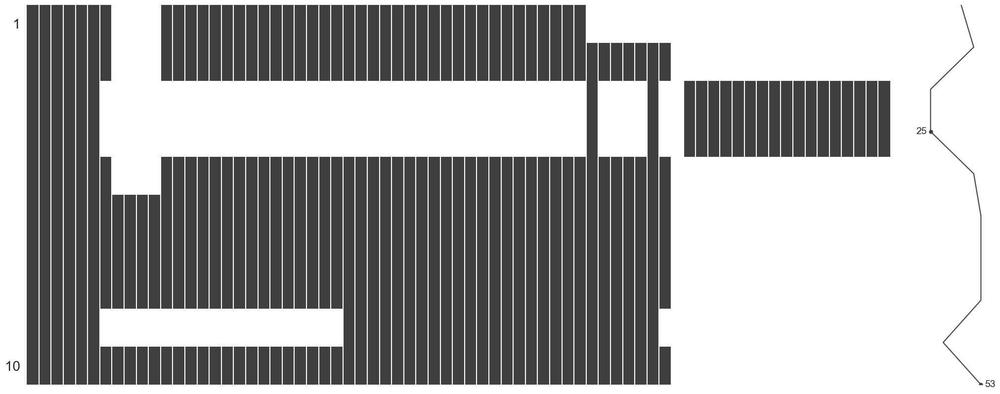

In [54]:
# Matrice des valeurs manquantes par indicateur
msno.matrix(data_indicator)

<Axes: >

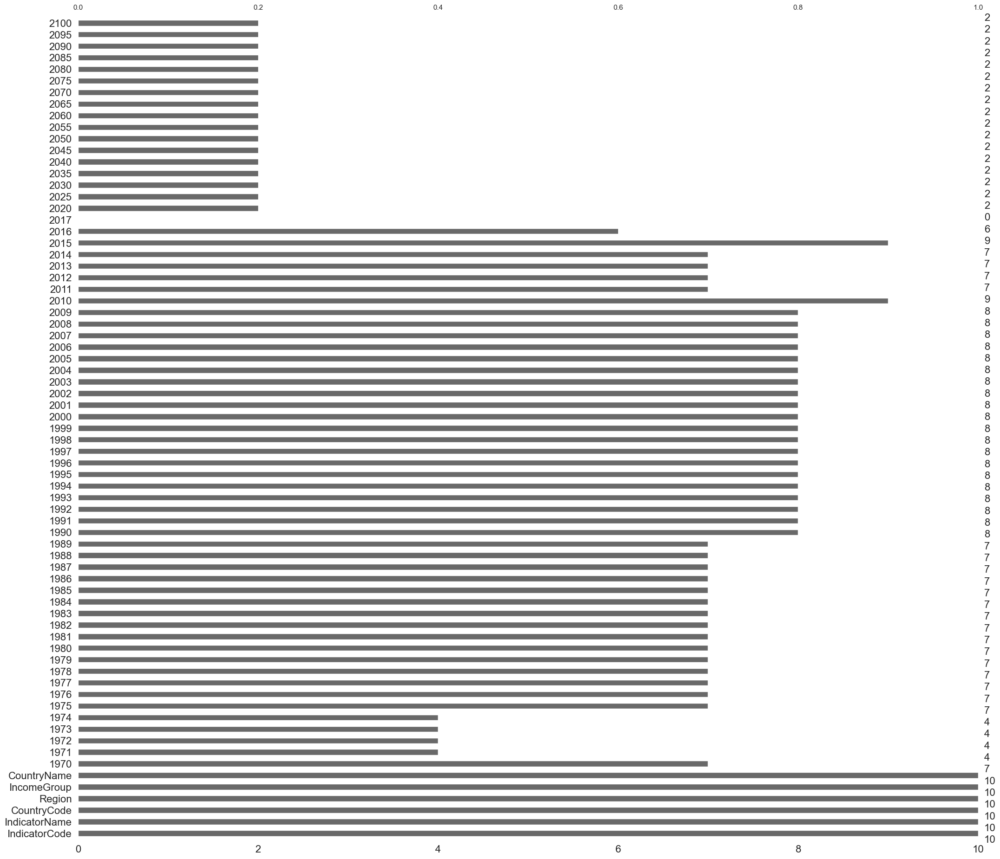

In [55]:
msno.bar(data_indicator)

**Observations** : 
- Le taux de remplissage est plus important à partir de 1999. 2017 est vide et 2016 très peu remplie.
- Les années 2010 et 2015 sont remplies quand 2020-2100 remplies.

<div class="alert alert-block alert-info">
Les années 2000 à 2015 ont le moins de valeurs manquantes : ce sont ces années qui seront conservées pour les données passées. Pour les projections, les années 2020 à 2040 seront conservées.
<div>

#### Séparation des données en passé et projection

- **Dataframe avec les données de projection**

In [56]:
# Dataframe avec les données de projection
proj_year = ['2020', '2025', '2030', '2035', '2040']
data_col = ['CountryName', 'CountryCode',  'Region', 'IncomeGroup', 'IndicatorName', 'IndicatorCode']
proj_col = data_col+proj_year
data_proj = data_df.loc[data_df['IndicatorCode'].isin(ind_proj_list)==True, proj_col]
display(data_proj.head())

,CountryName,CountryCode,Region,IncomeGroup,IndicatorName,IndicatorCode,2020,2025,2030,2035,2040
3434,Aruba,ABW,Latin America & Caribbean,High income: nonOECD,Wittgenstein Projection: Percentage of the pop...,PRJ.ATT.2024.4.MF,0.09,0.09,0.10,0.11,0.11
3602,Aruba,ABW,Latin America & Caribbean,High income: nonOECD,Wittgenstein Projection: Population age 15-19 ...,PRJ.POP.1519.3.MF,1.38,1.42,1.46,1.66,1.82
7099,Afghanistan,AFG,South Asia,Low income,Wittgenstein Projection: Percentage of the pop...,PRJ.ATT.2024.4.MF,NaN,NaN,NaN,NaN,NaN
7267,Afghanistan,AFG,South Asia,Low income,Wittgenstein Projection: Population age 15-19 ...,PRJ.POP.1519.3.MF,NaN,NaN,NaN,NaN,NaN
10764,Angola,AGO,Sub-Saharan Africa,Upper middle income,Wittgenstein Projection: Percentage of the pop...,PRJ.ATT.2024.4.MF,NaN,NaN,NaN,NaN,NaN


- **Dataframe avec les données passées**

In [57]:
# Dataframe avec les données passées
past_year = ['2000', '2001', '2002', '2003', '2004', '2005', '2006','2007', 
             '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015']
past_col = data_col + past_year
data_past = data_df.loc[data_df['IndicatorCode'].isin(ind_past_list)==True, past_col]
display(data_past.head())

,CountryName,CountryCode,Region,IncomeGroup,IndicatorName,IndicatorCode,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015
1191,Aruba,ABW,Latin America & Caribbean,High income: nonOECD,"Enrolment in secondary education, both sexes (...",SE.SEC.ENRL,6178.000000,6428.00000,6757.00000,6869.0,6973.0000,7116.000000,7439.000000,7853.00000,7270.00000,7439.00000,7342.00000,7378.00000,8377.00000,NaN,NaN,NaN
1204,Aruba,ABW,Latin America & Caribbean,High income: nonOECD,"Enrolment in tertiary education, all programme...",SE.TER.ENRL,1578.000000,1628.00000,1592.00000,1672.0,1704.0000,2106.000000,2094.000000,2232.00000,2242.00000,2196.00000,2330.00000,2504.00000,2621.00000,1181.00000,1235.00000,1166.000000
1260,Aruba,ABW,Latin America & Caribbean,High income: nonOECD,Government expenditure on education as % of GD...,SE.XPD.TOTL.GD.ZS,4.714680,4.73949,4.92427,NaN,4.4089,4.680760,NaN,4.79918,4.91559,5.92467,6.71249,6.03687,6.54906,6.80806,6.16293,NaN
1375,Aruba,ABW,Latin America & Caribbean,High income: nonOECD,Internet users (per 100 people),IT.NET.USER.P2,15.442823,17.10000,18.80000,20.8,23.0000,25.400000,28.000000,30.90000,52.00000,58.00000,62.00000,69.00000,74.00000,78.90000,83.78000,88.661227
2084,Aruba,ABW,Latin America & Caribbean,High income: nonOECD,Personal computers (per 100 people),IT.CMP.PCMP.P2,NaN,NaN,NaN,NaN,NaN,7.923544,9.917683,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## <font color='green'>2.4. Filtrage sur la population et valeurs manquantes (pays et indicateurs)<a class="anchor" id="2_4"></a></font>

### Filtre sur la population des pays

La taille du marché est une donnée importante : les petits pays ne sont pas intéressants pour le développement à l'international. 
- L'indicateur qui mesure la population totale des pays est 'SP.POP.TOTL'. 
- L'année la plus récente avec le plus de données est 2011.
- Le seuil de population minimum est fixé à 100 000 hab.

In [58]:
# Année avec le plus de données
data_past.loc[data_past['IndicatorCode']=='SP.POP.TOTL'].info()

<class 'pandas.core.frame.DataFrame'>
Index: 215 entries, 2533 to 786843
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   CountryName    215 non-null    object 
 1   CountryCode    215 non-null    object 
 2   Region         214 non-null    object 
 3   IncomeGroup    214 non-null    object 
 4   IndicatorName  215 non-null    object 
 5   IndicatorCode  215 non-null    object 
 6   2000           214 non-null    float64
 7   2001           214 non-null    float64
 8   2002           214 non-null    float64
 9   2003           214 non-null    float64
 10  2004           214 non-null    float64
 11  2005           214 non-null    float64
 12  2006           214 non-null    float64
 13  2007           214 non-null    float64
 14  2008           214 non-null    float64
 15  2009           214 non-null    float64
 16  2010           214 non-null    float64
 17  2011           214 non-null    float64
 18  2012     

In [59]:
# Une valeur manquante pour 2011
pop = data_past.loc[data_past['IndicatorCode']=='SP.POP.TOTL',
                    ['CountryName', 'CountryCode', 'IndicatorName', 'IndicatorCode','2011']]
pop.loc[pop.isna().sum(axis=1)==1]

,CountryName,CountryCode,IndicatorName,IndicatorCode,2011
786843,British Virgin Islands,VGB,"Population, total",SP.POP.TOTL,NaN


Les British Virgin Islands sont un petit pays (population < 40 000 hab)-> à ne pas conserver pour la suite.

In [60]:
# Filtrer les pays avec une population inférieure à 100 000 hab
seuil_pop = 100000
country_list = pop.loc[pop['2011']>=seuil_pop,'CountryCode'].to_list()
len(country_list)

193

In [61]:
# Données passées
data_past = list_filter(data_past, 'CountryCode', country_list, True)

Dimensions avant le filtre : (1720, 22)
Dimensions après le filtre : (1544, 22)


In [62]:
# Données projection
data_proj = list_filter(data_proj, 'CountryCode', country_list, True)

Dimensions avant le filtre : (430, 11)
Dimensions après le filtre : (386, 11)


### Indicateurs utilisables parmi la liste des indicateurs pertinents

- **Données passées**

C:\Users\Adeline\AppData\Local\Temp\ipykernel_7144\3153387194.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30)
C:\Users\Adeline\AppData\Local\Temp\ipykernel_7144\3153387194.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30)


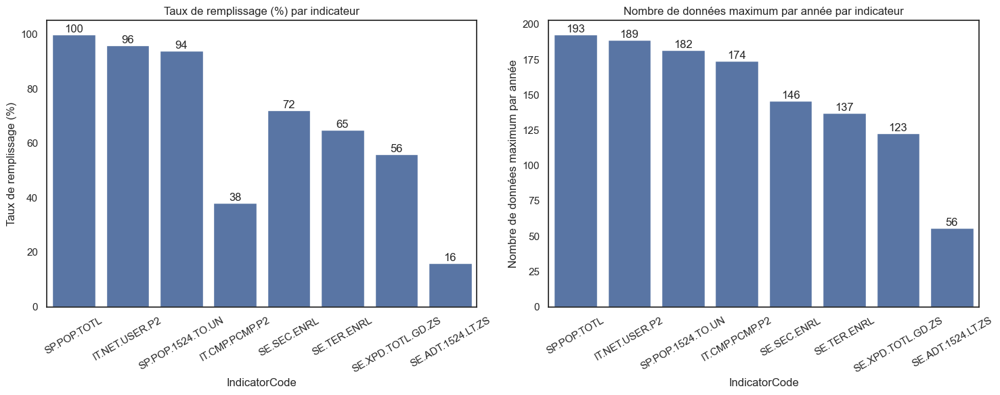

In [63]:
# Grouper par indicateurs
data_ind_past = data_past.groupby('IndicatorCode')[past_year].count()

# Remplacer les 0 par 'NaN' pour les années où il n'y a pas de valeurs pour l'indicateur 
column = data_ind_past.columns.to_list()

for col in column:
    data_ind_past.loc[data_ind_past[col]==0, col] = np.nan

data_ind_past = data_ind_past.reset_index()

# Taux de remplissage par indicateur
data_ind_past['tx_rempl'] = round(data_ind_past[past_year].sum(axis=1) / (len(past_year) * len(country_list)) * 100)
data_ind_past = data_ind_past.sort_values('tx_rempl', ascending=False)

# Nombre de données maximum par indicateur
data_ind_past['rempl_max'] = data_ind_past[past_year].max(axis=1)
data_ind_past = data_ind_past.sort_values('rempl_max', ascending=False)

# Affichage des résultats
fig, axs = plt.subplots(1, 2, figsize=(15, 6))
label = ['Taux de remplissage (%)', 'Nombre de données maximum par année']

for i, var in enumerate(['tx_rempl','rempl_max']):
    ax = axs[i]
    sns.barplot(data=data_ind_past, x='IndicatorCode', y=var, ax=ax)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=30)
    ax.bar_label(ax.containers[0], fontsize=fontsize)
    ax.set_ylabel(label[i], fontsize=fontsize)
    ax.set_title(label[i]+' par indicateur', fontsize=fontsize)

plt.tight_layout()
plt.show()

Les indicateurs suivants ont un taux de remplissage inférieur à 60% et peu de données par pays: 
- SE.ADT.1524.LT.ZS : niveau d'alphabétisation 
- SE.XPD.TOTL.GD.ZS : nombre d'élèves inscrits dans le secondaire supérieur

La population totale 'SP.POP.TOTL' n'est pas utile pour la suite de l'analyse.

In [64]:
# Exclure les indicateurs non utilisatbles
elt_to_del = ['SE.ADT.1524.LT.ZS','SE.XPD.TOTL.GD.ZS', 'SP.POP.TOTL']
ind_past_list = [x for x in ind_past_list if x not in elt_to_del] 

In [65]:
# Filtrer sur les indicateurs retenus
data_past = list_filter(data_past, 'IndicatorCode', ind_past_list, True)

Dimensions avant le filtre : (1544, 22)
Dimensions après le filtre : (965, 22)


- **Données projetées**

In [66]:
# Grouper par indicateurs
data_ind_proj = data_proj.groupby('IndicatorCode')[proj_year].count()

# Remplacer les 0 par 'NaN' pour les années où il n'y a pas de valeurs pour l'indicateur 
column = data_ind_proj.columns.to_list()

for col in column:
    data_ind_proj.loc[data_ind_proj[col]==0, col] = np.nan

data_ind_proj = data_ind_proj.reset_index()

display(data_ind_proj)

,IndicatorCode,2020,2025,2030,2035,2040
0,PRJ.ATT.2024.4.MF,166.0,166.0,166.0,166.0,166.0
1,PRJ.POP.1519.3.MF,166.0,166.0,166.0,166.0,166.0


<div class="alert alert-block alert-info">
Les indicateurs retenus pour l'analyse sont : 'IT.CMP.PCMP.P2', 'IT.NET.USER.P2', 'SP.POP.1524.TO.UN', 'SE.SEC.ENRL',
 'SE.TER.ENRL'
<div>

In [67]:
# Mise à jour de la liste des indicateurs
ind_list = ind_past_list+ind_proj_list

### Filtre des pays sur le taux de valeurs manquantes

- **Données passées**

In [68]:
# Exclure les pays qui ont des lignes entièrement vides
empty_line=len(past_year)
data_past[data_past.isna().sum(axis=1)==empty_line].groupby(['CountryCode', 'CountryName'])['IndicatorCode'].count()

CountryCode  CountryName                   
ARE          United Arab Emirates              1
AZE          Azerbaijan                        1
BHS          Bahamas, The                      1
CHI          Channel Islands                   5
CUW          Curacao                           3
GUM          Guam                              4
HTI          Haiti                             2
KAZ          Kazakhstan                        1
KIR          Kiribati                          1
LBR          Liberia                           1
MNE          Montenegro                        2
NCL          New Caledonia                     3
PNG          Papua New Guinea                  1
PRI          Puerto Rico                       1
PRK          Korea, Dem. People’s Rep.         1
PYF          French Polynesia                  3
SLB          Solomon Islands                   1
SLE          Sierra Leone                      1
SOM          Somalia                           1
SRB          Serbia      

In [69]:
# Exclure les pays qui ont des lignes entièrement vides
elt_to_del = list(data_past.loc[data_past.isna().sum(axis=1)==empty_line, 'CountryCode'].unique())
country_list = [x for x in country_list if x not in elt_to_del] 
len(country_list)

166

- **Données projetées**

In [70]:
# Données projection
data_proj = list_filter(data_proj, 'CountryCode', country_list, True)

Dimensions avant le filtre : (386, 11)
Dimensions après le filtre : (332, 11)


In [71]:
# Afficher les valeurs manquantes par pays
data_country_proj = data_proj.groupby(['CountryName', 'CountryCode'])[proj_year].count()

# Remplacer les 0 par 'NaN' pour les années où il n'y a pas de valeurs pour l'indicateur 
column = data_country_proj.columns.to_list()

for col in column:
    data_country_proj.loc[data_country_proj[col]==0, col] = np.nan
    
data_country_proj = data_country_proj.reset_index()

# Pays avec des valeurs manquantes
data_country_proj[data_country_proj.isna().sum(axis=1)!=0]

,CountryName,CountryCode,2020,2025,2030,2035,2040
0,Afghanistan,AFG,NaN,NaN,NaN,NaN,NaN
3,Angola,AGO,NaN,NaN,NaN,NaN,NaN
11,Barbados,BRB,NaN,NaN,NaN,NaN,NaN
19,Botswana,BWA,NaN,NaN,NaN,NaN,NaN
21,Brunei Darussalam,BRN,NaN,NaN,NaN,NaN,NaN
44,Djibouti,DJI,NaN,NaN,NaN,NaN,NaN
50,Eritrea,ERI,NaN,NaN,NaN,NaN,NaN
53,Fiji,FJI,NaN,NaN,NaN,NaN,NaN
62,Grenada,GRD,NaN,NaN,NaN,NaN,NaN
89,Libya,LBY,NaN,NaN,NaN,NaN,NaN


Ces pays ne sont pas retenus pour l'analyse: beaucoup sont des pays instables politiquement.

In [72]:
# Exclure les pays qui ont des lignes entièrement vides
elt_to_del = list(data_country_proj.loc[data_country_proj.isna().sum(axis=1)!=0, 'CountryCode'].unique())
country_list = [x for x in country_list if x not in elt_to_del] 
len(country_list)

149

In [73]:
# Pays retenus par région
data_past.loc[data_past['CountryCode'].isin(country_list)==True]\
          .groupby('Region')['CountryCode'].count().reset_index()

,Region,CountryCode
0,East Asia & Pacific,95
1,Europe & Central Asia,215
2,Latin America & Caribbean,130
3,Middle East & North Africa,80
4,North America,10
5,South Asia,30
6,Sub-Saharan Africa,185


In [74]:
# Données passées
data_past = list_filter(data_past, 'CountryCode', country_list, True)

Dimensions avant le filtre : (965, 22)
Dimensions après le filtre : (745, 22)


In [75]:
# Nb de valeurs manquantes restantes
nb_na_past = data_past.isna().sum()
nb_na_past[nb_na_past>0]

2000     88
2001     72
2002     68
2003     76
2004     67
2005     73
2006    136
2007    170
2008    189
2009    210
2010    209
2011    208
2012    209
2013    219
2014    229
2015    266
dtype: int64

Les années ne sont pas toutes remplies pour les indicateurs choisis.

In [76]:
# Données projection
data_proj = list_filter(data_proj, 'CountryCode', country_list, True)

Dimensions avant le filtre : (332, 11)
Dimensions après le filtre : (298, 11)


##### Application des filtres

In [77]:
# Filtrer sur les pays, années et indicateurs
print('Dimensions avant filtre', footnote_df.shape)
footnote_df = footnote_df.loc[(footnote_df['CountryCode'].isin(country_list)==True)&
                             (footnote_df['SeriesCode'].isin(ind_list)==True)&
                             (footnote_df['Year'].isin((past_year+proj_year))==True)]
print('Dimensions après filter', footnote_df.shape)

Dimensions avant filtre (516743, 4)
Dimensions après filter (3525, 4)


In [78]:
footnote_df.SeriesCode.unique()

array(['SE.SEC.ENRL', 'SE.TER.ENRL', 'IT.NET.USER.P2'], dtype=object)

In [79]:
# Filtrer sur les pays et indicateurs
print('Dimensions avant filtre', cseries_df.shape)
cseries_df = cseries_df.loc[(cseries_df['CountryCode'].isin(country_list)==True)&
                            (cseries_df['SeriesCode'].isin(ind_list)==True)]
print('Dimensions après filter', cseries_df.shape)

Dimensions avant filtre (611, 3)
Dimensions après filter (0, 3)


Le jeu de données Country_Series ne contient pas de données pour les indicateurs retenus. Pour Footnote, 3 indicateurs sur les 7 sont concernés.

## <font color='green'>2.5. Récupérer la dernière valeur non null par pays et indicateur<a class="anchor" id="2_5"></a></font>

Pour éviter d'avoir des valeurs manquantes pour l'analyse, nous allons récupérer la dernière valeur non null de chaque ligne du dataframe data_past.
Pour cela, nous utiliserons la fonction **last_non_null_value()** qui stocke la dernière valeur non null et la colonne correspondante dans 2 variables.

In [80]:
# Récupérer la dernière valeur non null par pays et indicateur
last_values = []
column_names = []

# Itération sur chaque ligne du dataframe
for index, row in data_past.iterrows():
    last_value, column_name = last_non_null_value(row)
    last_values.append(last_value)
    column_names.append(column_name)

# Ajout de colonnes avec la dernière valeur non null et l'année correspondante    
data_past['last_value'] = last_values
data_past['year'] = column_names

In [81]:
# Pivot de data_past pour avoir les indicateurs en colonne et les last_value en valeurs
df_final = data_past.pivot_table(index=['CountryCode', 'CountryName', 'Region', 'IncomeGroup'], 
                                  columns = 'IndicatorCode',
                                  values = 'last_value'
                                 ).reset_index()

df_final=df_final.rename(columns={'IT.CMP.PCMP.P2': 'PC',
                                  'IT.NET.USER.P2' : 'Internet_User',
                                  'SE.SEC.ENRL' : 'Enroll_secondary',
                                  'SE.TER.ENRL' : 'Enroll_tertiary',
                                  'SP.POP.1524.TO.UN' : 'Pop_15-24'
                                   })
display(df_final)

IndicatorCode,CountryCode,CountryName,Region,IncomeGroup,PC,Internet_User,Enroll_secondary,Enroll_tertiary,Pop_15-24
0,ABW,Aruba,Latin America & Caribbean,High income: nonOECD,9.917683,88.661227,8.377000e+03,1.166000e+03,14455.0
1,ALB,Albania,Europe & Central Asia,Upper middle income,4.593538,63.252933,3.150790e+05,1.605270e+05,556269.0
2,ARG,Argentina,Latin America & Caribbean,Upper middle income,9.056130,68.043064,4.450741e+06,2.869450e+06,6886530.0
3,ARM,Armenia,Europe & Central Asia,Lower middle income,9.851017,59.102378,2.402910e+05,1.076650e+05,446958.0
4,AUS,Australia,East Asia & Pacific,High income: OECD,60.140967,84.560519,2.371284e+06,1.453521e+06,2914620.0
5,AUT,Austria,Europe & Central Asia,High income: OECD,60.641342,83.940142,6.910712e+05,4.259717e+05,964629.0
6,BDI,Burundi,Sub-Saharan Africa,Low income,0.808198,4.866224,6.642430e+05,5.122500e+04,2087945.0
7,BEL,Belgium,Europe & Central Asia,High income: OECD,37.628187,85.052900,1.217912e+06,5.047450e+05,1241946.0
8,BEN,Benin,Sub-Saharan Africa,Low income,0.689062,11.254988,9.637870e+05,1.454640e+05,2263486.0
9,BFA,Burkina Faso,Sub-Saharan Africa,Low income,0.651124,11.387646,9.655500e+05,7.427600e+04,3781805.0


# <font color='blue'>Partie 3 - Analyse descriptive et exploratoire<a class="anchor" id="partie3"></a></font>


In [82]:
# Liste des indicateurs
indicator = ['PC', 'Internet_User', 'Enroll_secondary', 'Enroll_tertiary', 'Pop_15-24']

## <font color='green'>3.1. Distribution des données par indicateurs <a class="anchor" id="3_1"></a></font>

In [83]:
# Données statistiques 
df_final.describe()

IndicatorCode,PC,Internet_User,Enroll_secondary,Enroll_tertiary,Pop_15-24
count,149.000000,149.000000,1.490000e+02,1.490000e+02,1.490000e+02
mean,18.710466,49.062377,3.712540e+06,1.378487e+06,7.614901e+06
std,23.802133,27.838015,1.311844e+07,4.760631e+06,2.636972e+07
min,0.022211,2.476220,8.377000e+03,6.680000e+02,1.445500e+04
25%,1.980591,22.351405,2.402910e+05,6.354300e+04,5.035290e+05
50%,8.222196,50.139318,7.214140e+05,2.210180e+05,1.411616e+06
75%,25.561224,72.834700,2.522661e+06,7.728770e+05,5.479911e+06
max,96.170657,98.200000,1.295421e+08,4.336739e+07,2.441202e+08


- **Observations :**
Les indicateurs ont des échelles très différentes : il faudra appliquer un scaler pour une mise à l'échelle.

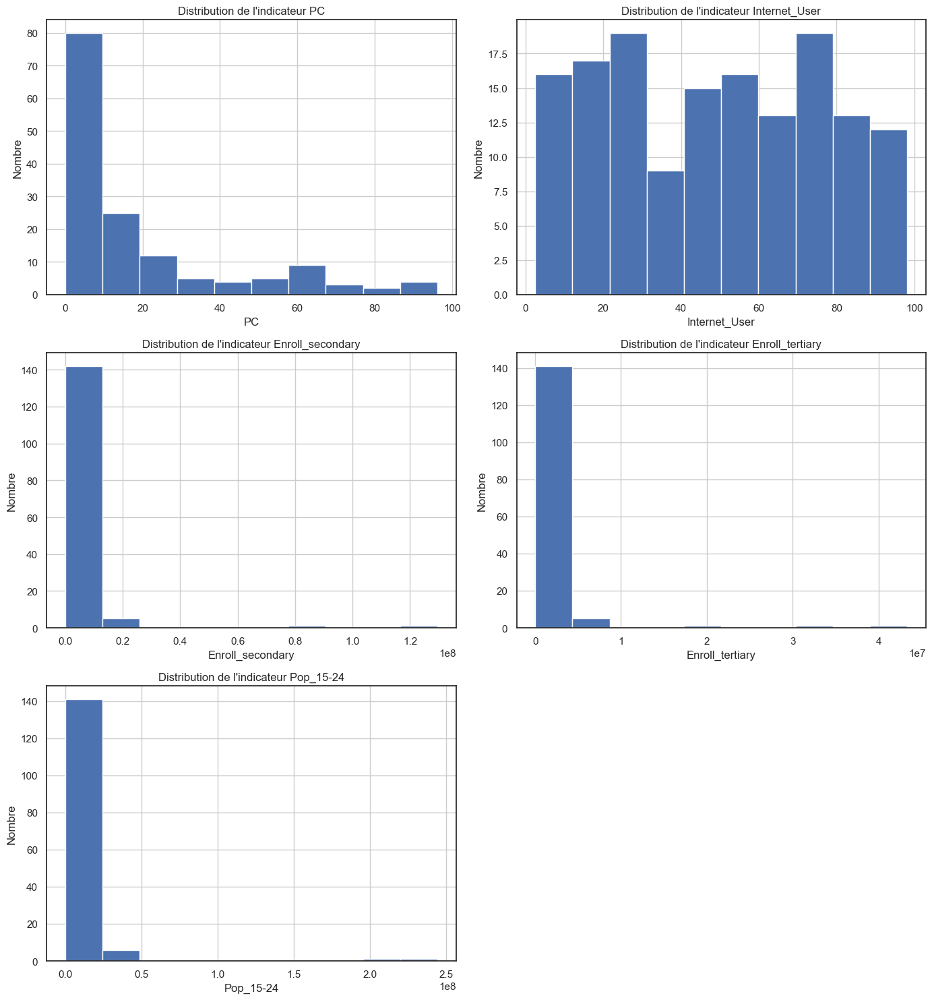

In [84]:
# Distribution des indicateurs
nb_cols = 2
nb_rows = 3
fig, axs = plt.subplots(nb_rows, nb_cols, figsize=(width*nb_cols, height*nb_rows))

# Boucle pour créer et afficher les graphiques
for i, ind in enumerate(indicator):
    q, mod = divmod(i, nb_cols)
    ax = axs[q, mod]
    ax.hist(df_final[ind])
    ax.set_title("Distribution de l'indicateur "+ind, fontsize=fontsize)
    ax.set_xlabel(ind, fontsize=fontsize)
    ax.set_ylabel('Nombre', fontsize=fontsize) 
    ax.grid()
     
    # Masquer les graphiques vides (s'il y en a)
    for i in range(len(indicator), nb_rows * nb_cols):
        axs[i // nb_cols, i % nb_cols].axis('off')
    
plt.tight_layout()
plt.show()

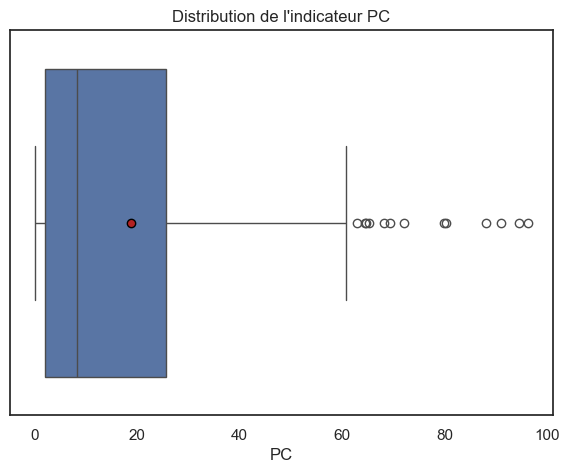


Nombre d'outliers détectés => 9


IndicatorCode,CountryCode,CountryName,PC
82,LUX,Luxembourg,68.209751
57,HKG,"Hong Kong SAR, China",69.394030
122,SGP,Singapore,72.061563
143,USA,United States,79.915488
47,GBR,United Kingdom,80.170361
128,SWE,Sweden,88.011928
103,NLD,Netherlands,90.987849
20,CAN,Canada,94.446705
21,CHE,Switzerland,96.170657


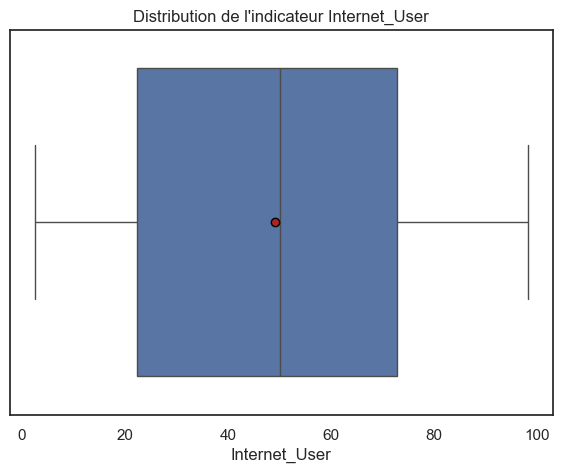


Nombre d'outliers détectés => 0


IndicatorCode,CountryCode,CountryName,Internet_User


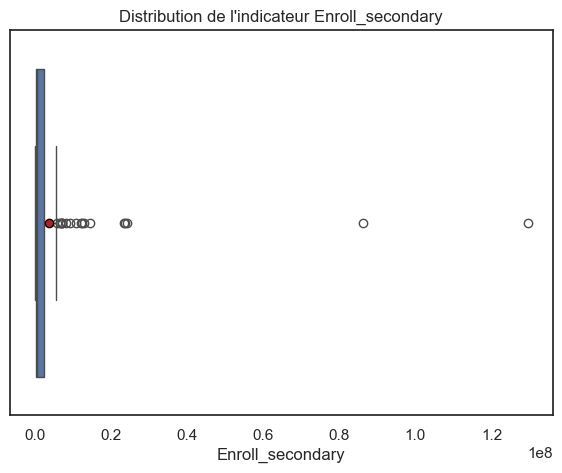


Nombre d'outliers détectés => 2


IndicatorCode,CountryCode,CountryName,Enroll_secondary
23,CHN,China,86127200.0
62,IND,India,129542056.0


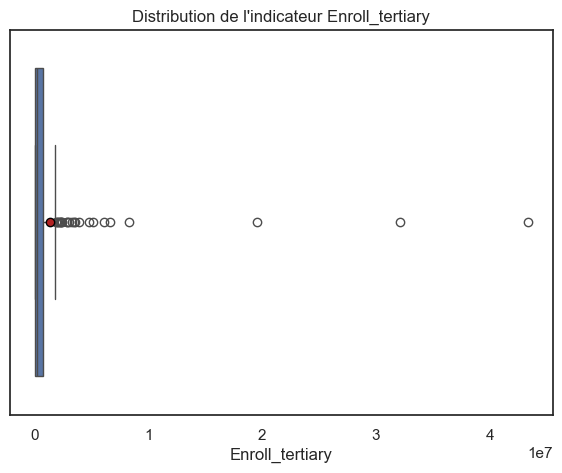


Nombre d'outliers détectés => 3


IndicatorCode,CountryCode,CountryName,Enroll_tertiary
143,USA,United States,19531728.0
62,IND,India,32107420.0
23,CHN,China,43367392.0


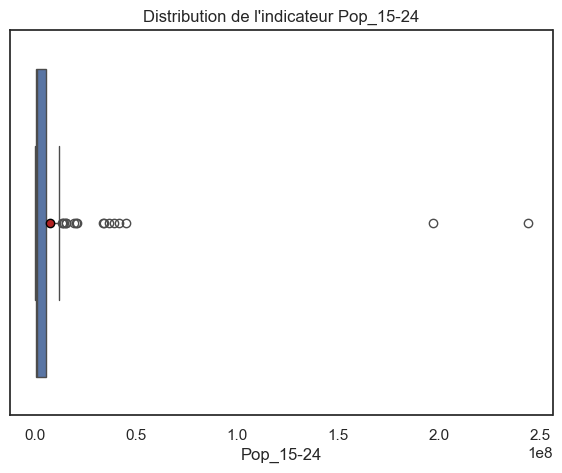


Nombre d'outliers détectés => 2


IndicatorCode,CountryCode,CountryName,Pop_15-24
23,CHN,China,197026759.0
62,IND,India,244120201.0


In [85]:
# Boxplots et outliers pour les différentes colonnes du df 
plot_outlier(df_final, indicator, 'CountryCode','CountryName')

- **Observations :** Les outliers ne sont pas des valeurs aberrantes : la Chine et l'Inde ressortent du fait de leur très grande population, de même pour les Etats-Unis.

## <font color='green'>3.2. Répartition géographique et par groupe de revenus des pays à analyser<a class="anchor" id="3_2"></a></font>

### Représentation géographique des pays par région et par groupe de revenu

In [86]:
# Représentation géographique des pays par région
fig = px.choropleth(df_final.sort_values('Region'), 
                    locations="CountryCode",
                    color="Region", 
                    color_discrete_sequence=colors_reg,
                    hover_name="CountryName")

fig.update_layout(title_text='Répartition géographique des pays retenus par région', 
                  title_x=0.45,
                  title_font=dict(size=15))
fig.show()

In [87]:
# Représentation géographique des pays par groupe de revenu
fig = px.choropleth(df_final.sort_values('IncomeGroup'),
                    locations="CountryCode",
                    color="IncomeGroup", 
                    color_discrete_sequence=colors_income,
                    hover_name="CountryName")

fig.update_layout(title_text='Répartition géographique des pays retenus par groupe de revenu', 
                  title_x=0.45,
                  title_font=dict(size=15))
fig.show()

In [88]:
# Répartition des pays par continent et par income group(%)
df_reg = df_final.groupby('Region')['CountryName'].count().reset_index().sort_values('Region')
df_income = df_final.groupby('IncomeGroup')['CountryName'].count().reset_index().sort_values('IncomeGroup')

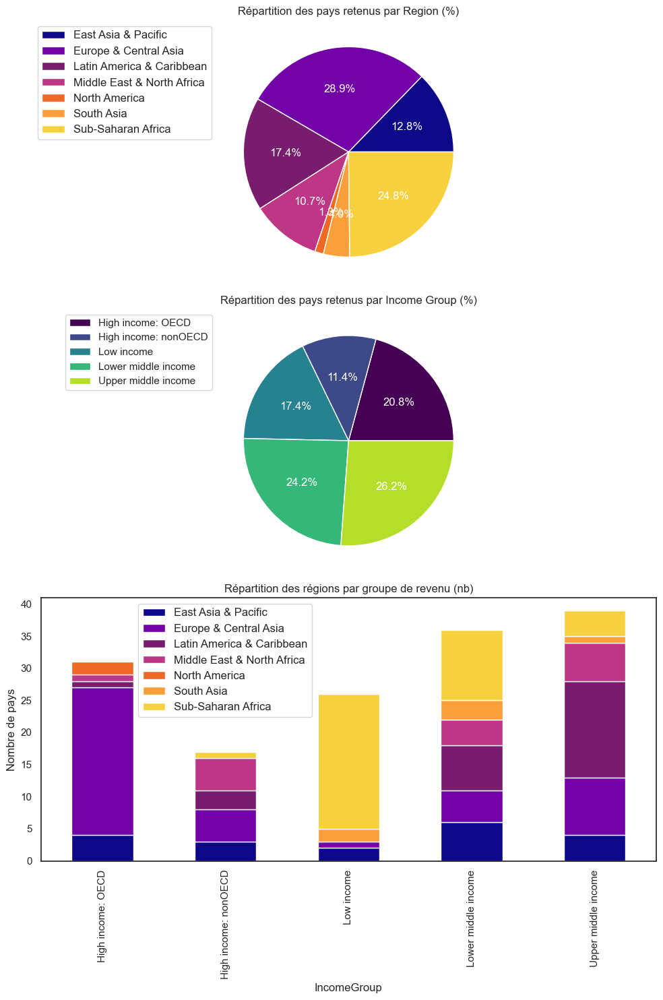

In [89]:
# Répartition des pays par continent et par income group(%), des régions par groupe de revenu (nb)
labels_reg = df_reg['Region']
labels_income = df_income['IncomeGroup']

nb_rows = 3
fig, axs = plt.subplots(nb_rows,1,figsize=(10,height*nb_rows))
 
# Répartition des pays retenus par Region (%)
ax = axs[0]
ax.pie(x=df_reg['CountryName'],                                   
         colors = colors_reg,
         autopct='%.1f%%',
         textprops=textprops_pie)
ax.set_title("Répartition des pays retenus par Region (%)", fontsize=fontsize)
ax.legend(labels = labels_reg, bbox_to_anchor=(0, 0, 0, 1), fontsize=fontsize)

#Répartition des pays retenus par Income Group (%)
ax = axs[1]
ax.pie(x=df_income['CountryName'],
       colors= colors_income,
       autopct='%.1f%%',
       textprops=textprops_pie)     
ax.set_title("Répartition des pays retenus par Income Group (%)", fontsize=fontsize) 
ax.legend(labels = labels_income, bbox_to_anchor=(0, 0, 0, 1))

#Répartition des régions par groupe de revenu (nb)
ax = axs[2]
df_final.pivot_table(index=['IncomeGroup'], columns='Region', values = 'CountryCode', aggfunc='count')\
        .plot(ax=ax, kind='bar', 
              title="Répartition des régions par groupe de revenu (nb)", 
              stacked=True, 
              color=colors_reg)
ax.legend(labels = labels_reg, bbox_to_anchor=(0, 0, 0.45, 1), fontsize=fontsize)
ax.set_ylabel('Nombre de pays', fontsize=fontsize)

plt.tight_layout()
plt.show()

 - **Observations :** 
     - Europe & Central Asia et North America représentent 1/3 des pays
     - 58% des pays sont à High Income ou Upper middle income
     - Les pays High Income OECD sont majoritairement des pays Europe & Central Asia et North America.
     - Les pays High Income non OECD majoritairement des pays Europe & Central Asia et Middle East & North Africa.
     - Les pays Upper Middle Income sont majoritairement des pays Latin America et Caribbean.

### Analyse par région géographique

IndicatorCode                      PC                                   \
                                 mean        std        min         q1   
Region                                                                   
East Asia & Pacific         25.117917  26.373777   0.378256   2.150049   
Europe & Central Asia       34.385066  27.177915   0.817567  10.493453   
Latin America & Caribbean    9.213645   5.451007   2.066422   4.418882   
Middle East & North Africa  16.956207  18.172568   0.792447   5.730586   
North America               87.181097  10.275123  79.915488  83.548292   
South Asia                   4.724689   7.469207   0.454261   0.879032   
Sub-Saharan Africa           3.202617   5.366038   0.022211   0.536289   

IndicatorCode                                                
                               median         q3        max  
Region                                                       
East Asia & Pacific          7.210996  46.838097  72.061563  
Europe & Central Asia       27.368652  56.425799  96.170657  
Latin America & Caribbean    9.158406  13.392133  23.147452  
Middle East & North Africa   9.945212  22.878164  65.234645  
North America               87.181097  90.813901  94.446705  
South Asia                   2.183200   2.998104  19.813424  
Sub-Saharan Africa           0.916950   3.326475  24.030374

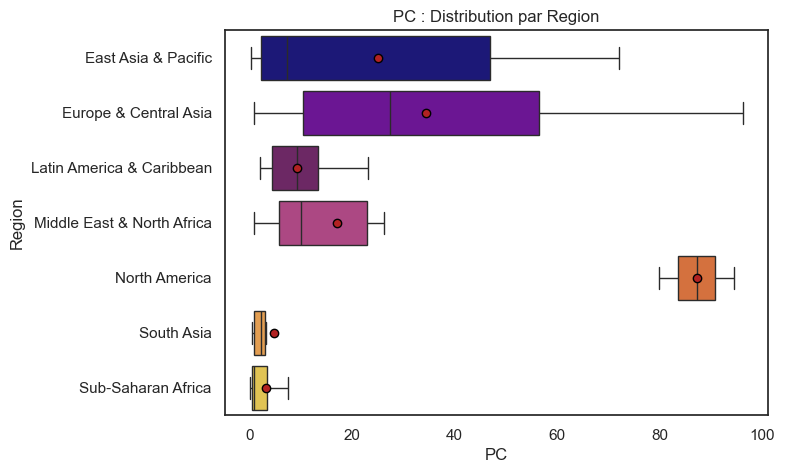

IndicatorCode              Internet_User                                   \
                                    mean        std        min         q1   
Region                                                                      
East Asia & Pacific            52.535754  28.923763  18.200000  22.163736   
Europe & Central Asia          71.325893  19.338633  14.996775  63.279779   
Latin America & Caribbean      48.872855  15.931562  19.704292  38.203823   
Middle East & North Africa     59.545706  22.238184  17.220000  43.551232   
North America                  81.512101   9.839955  74.554202  78.033152   
South Asia                     27.707262  16.324605  14.000000  15.195405   
Sub-Saharan Africa             18.713734  13.449530   2.476220   8.200000   

IndicatorCode                                                
                               median         q3        max  
Region                                                       
East Asia & Pacific         50.300000  81.786738  91.058028  
Europe & Central Asia       72.834700  85.737517  98.200000  
Latin America & Caribbean   48.689561  59.404201  88.661227  
Middle East & North Africa  58.769288  76.476022  93.478301  
North America               81.512101  84.991051  88.470000  
South Asia                  21.790809  36.350000  54.461955  
Sub-Saharan Africa          17.834859  25.000000  51.919116

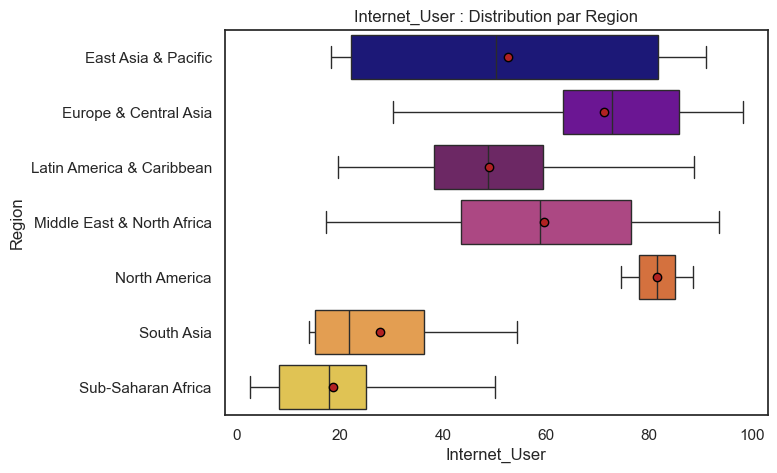

IndicatorCode              Enroll_secondary                           \
                                       mean           std        min   
Region                                                                 
East Asia & Pacific            7.689280e+06  1.978637e+07    14961.0   
Europe & Central Asia          1.650028e+06  2.581478e+06    38238.0   
Latin America & Caribbean      2.403060e+06  5.058604e+06     8377.0   
Middle East & North Africa     2.031955e+06  2.361243e+06    29434.0   
North America                  1.346364e+07  1.522561e+07  2697507.0   
South Asia                     2.657769e+07  5.081548e+07    28878.0   
Sub-Saharan Africa             1.479367e+06  2.309077e+06    22123.0   

IndicatorCode                                                                 
                                    q1      median           q3          max  
Region                                                                        
East Asia & Pacific          256982.00    930200.0   5076970.00   86127200.0  
Europe & Central Asia        277972.50    643407.0   1390436.00   10969178.0  
Latin America & Caribbean    234351.25    634365.0   1843253.25   23501784.0  
Middle East & North Africa   358493.50    896351.5   2770397.75    8208329.0  
North America               8080574.25  13463641.5  18846708.75   24229776.0  
South Asia                   849750.25   7627118.5  13944557.50  129542056.0  
Sub-Saharan Africa           129008.00    945484.0   1587348.00   12532753.0

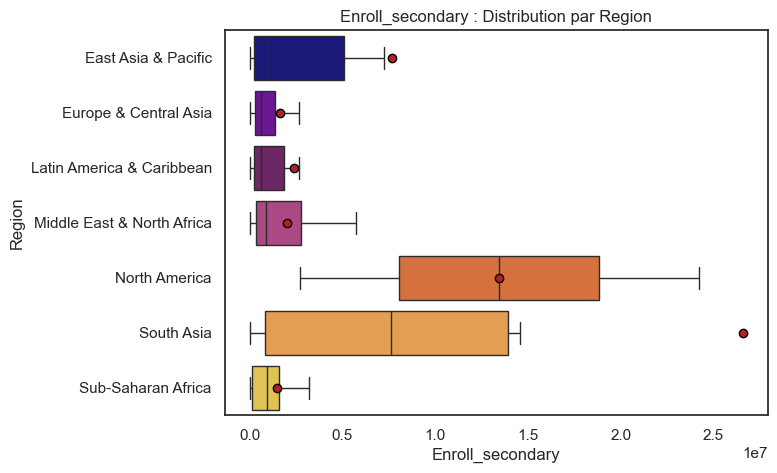

IndicatorCode              Enroll_tertiary                           \
                                      mean           std        min   
Region                                                                
East Asia & Pacific           3.457629e+06  9.793637e+06      668.0   
Europe & Central Asia         8.446968e+05  1.435601e+06     6085.0   
Latin America & Caribbean     9.506323e+05  1.775226e+06     1166.0   
Middle East & North Africa    8.851714e+05  1.284524e+06    13216.0   
North America                 1.037194e+07  1.295389e+07  1212161.0   
South Asia                    6.084551e+06  1.278073e+07     6089.0   
Sub-Saharan Africa            1.958742e+05  3.193013e+05     1003.0   

IndicatorCode                                                                  
                                    q1        median           q3         max  
Region                                                                         
East Asia & Pacific          154865.50  2.986427e+05   2751774.50  43367392.0  
Europe & Central Asia        118514.00  2.944500e+05    609541.00   6592416.0  
Latin America & Caribbean     80993.50  2.215260e+05   1009491.25   8285475.0  
Middle East & North Africa   180297.50  3.483365e+05    980421.50   4802721.0  
North America               5792052.75  1.037194e+07  14951836.25  19531728.0  
South Asia                   117738.25  1.158450e+06   2019160.00  32107420.0  
Sub-Saharan Africa            12538.00  8.033500e+04    167983.00   1513371.0

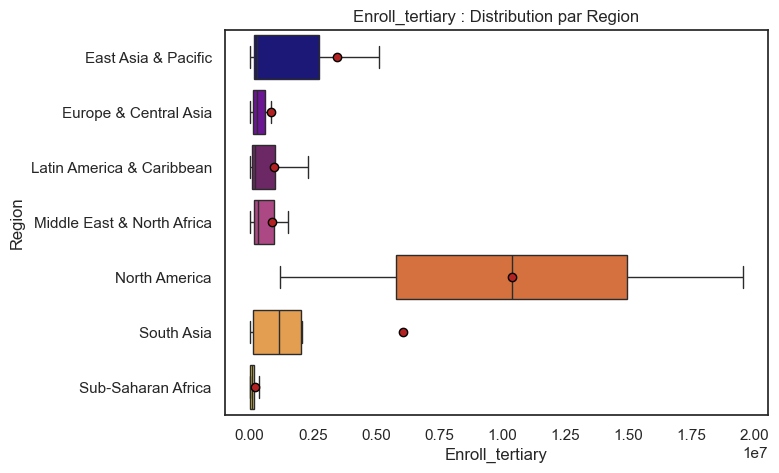

IndicatorCode                  Pop_15-24                           \
                                    mean           std        min   
Region                                                              
East Asia & Pacific         1.635554e+07  4.488328e+07    22956.0   
Europe & Central Asia       2.283544e+06  3.451855e+06    44570.0   
Latin America & Caribbean   4.008503e+06  7.381280e+06    14455.0   
Middle East & North Africa  4.092245e+06  4.767610e+06    51504.0   
North America               2.476051e+07  2.883158e+07  4373511.0   
South Asia                  5.410529e+07  9.464410e+07    69984.0   
Sub-Saharan Africa          4.914129e+06  7.058695e+06    38279.0   

IndicatorCode                                                                  
                                     q1      median           q3          max  
Region                                                                         
East Asia & Pacific           558185.50   2914620.0   8968267.50  197026759.0  
Europe & Central Asia         517366.50    964629.0   1836248.00   14661984.0  
Latin America & Caribbean     523680.00   1416623.0   3207604.50   33595574.0  
Middle East & North Africa    697156.25   1565703.0   6181607.50   15377746.0  
North America               14567012.50  24760514.0  34954015.50   45147517.0  
South Asia                   1813765.50  20606662.0  37910756.75  244120201.0  
Sub-Saharan Africa            493814.00   3009775.0   5230426.00   36659023.0

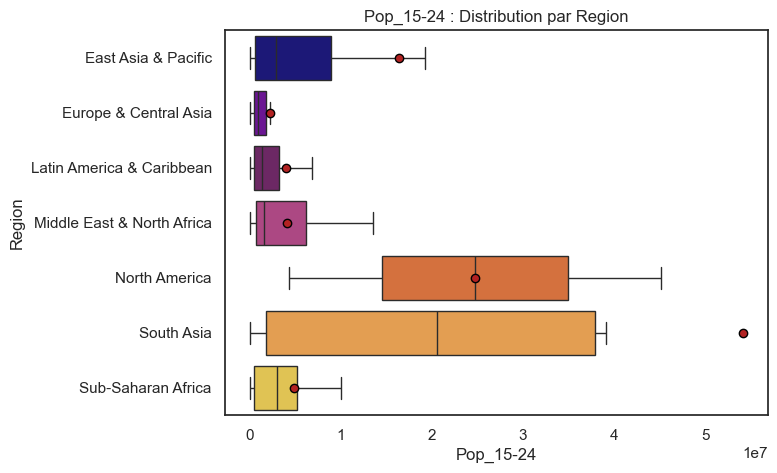

In [90]:
# Statistiques descriptives par région
stats(df_final, indicator, 'Region', colors_reg)

- **Observations :** North America est une région très intéressante pour notre étude.

### Analyse par groupe de revenu

IndicatorCode                PC                                             \
                           mean        std       min         q1     median   
IncomeGroup                                                                  
High income: OECD     52.636602  24.154151  9.454862  37.124406  54.869173   
High income: nonOECD  30.786619  21.819005  1.490935  13.533204  25.845367   
Low income             1.104070   1.518139  0.022211   0.321785   0.675209   
Lower middle income    4.791195   5.003380  0.259626   1.927055   3.379572   
Upper middle income   11.065730   7.815645  0.792447   5.996677   9.260681   

IndicatorCode                               
                             q3        max  
IncomeGroup                                 
High income: OECD     64.581326  96.170657  
High income: nonOECD  40.016006  72.061563  
Low income             1.161451   7.431140  
Lower middle income    5.776456  26.195419  
Upper middle income   15.814761  35.760414

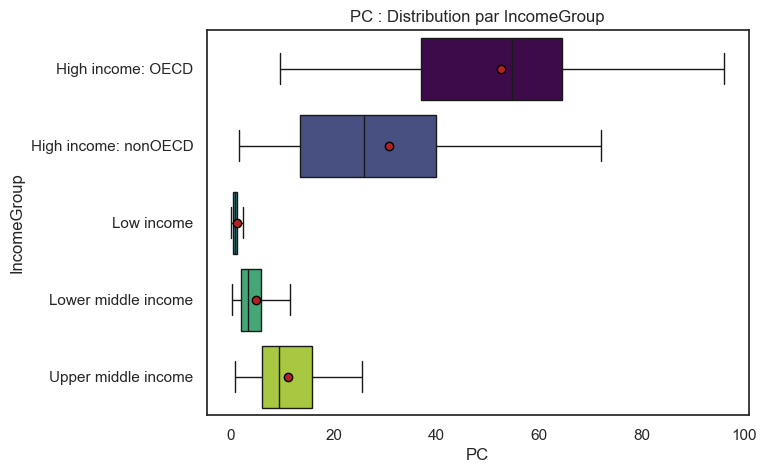

IndicatorCode        Internet_User                                   \
                              mean        std        min         q1   
IncomeGroup                                                           
High income: OECD        82.954068  10.408763  58.141735  76.510464   
High income: nonOECD     74.149140  15.985676  21.320000  69.803100   
Low income               11.937913   6.546870   2.476220   5.514459   
Lower middle income      32.613250  14.009786   7.615975  22.257570   
Upper middle income      51.121025  13.923230  14.996775  42.376076   

IndicatorCode                                          
                         median         q3        max  
IncomeGroup                                            
High income: OECD     85.052900  90.129415  98.200000  
High income: nonOECD  76.184000  79.200600  93.478301  
Low income            11.321317  17.771549  22.742818  
Lower middle income   27.211209  41.742440  63.306625  
Upper middle income   51.919116  59.938666  74.000000

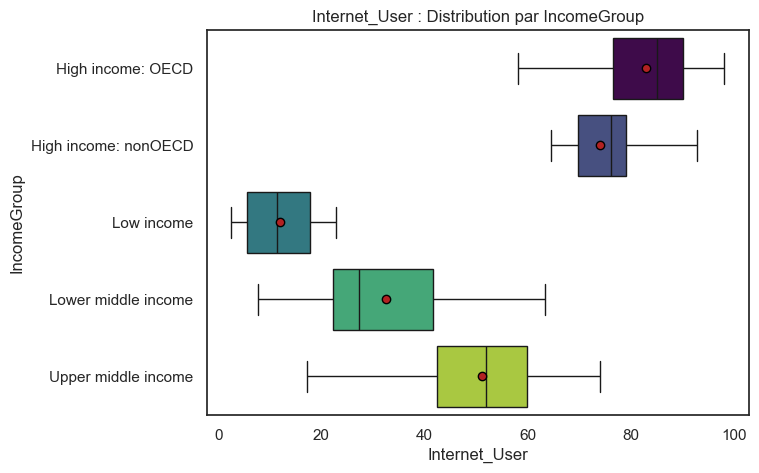

IndicatorCode        Enroll_secondary                                        \
                                 mean           std      min             q1   
IncomeGroup                                                                   
High income: OECD        2.669805e+06  4.555636e+06  38238.0  513715.171875   
High income: nonOECD     8.937481e+05  2.329270e+06   8377.0   57161.000000   
Low income               1.911515e+06  2.899272e+06  55176.0  612630.250000   
Lower middle income      6.051816e+06  2.170501e+07  20568.0  238533.250000   
Upper middle income      4.811435e+06  1.410889e+07  13215.0  246635.500000   

IndicatorCode                                            
                        median          q3          max  
IncomeGroup                                              
High income: OECD     784752.0  3005317.00   24229776.0  
High income: nonOECD  117761.0   291805.00    9384610.0  
Low income            964668.5  1912678.75   14566771.0  
Lower middle income   641819.0  2173783.75  129542056.0  
Upper middle income   825055.0  3720932.00   86127200.0

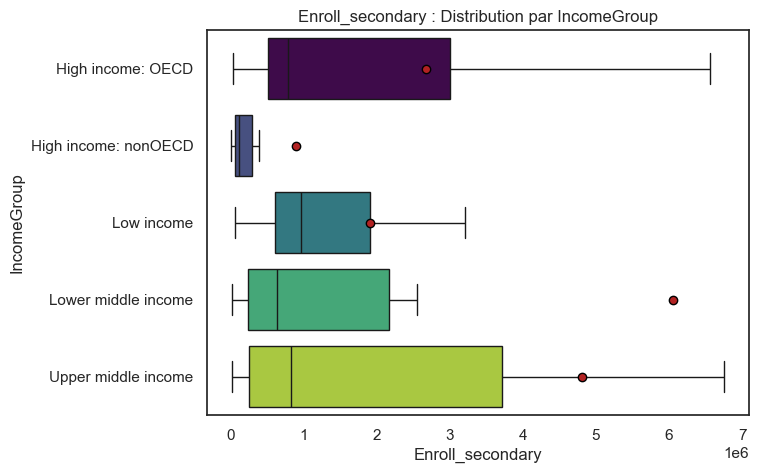

IndicatorCode        Enroll_tertiary                                       \
                                mean           std     min             q1   
IncomeGroup                                                                 
High income: OECD       1.607783e+06  3.488820e+06  6085.0  282262.109375   
High income: nonOECD    5.557130e+05  1.596547e+06  1003.0   27866.000000   
Low income              2.452297e+05  4.188845e+05  3689.0   44653.500000   
Lower middle income     1.525002e+06  5.360927e+06   955.0   84531.500000   
Upper middle income     2.175132e+06  7.007422e+06   668.0   69040.000000   

IndicatorCode                                          
                        median         q3         max  
IncomeGroup                                            
High income: OECD     428557.0  1794571.5  19531728.0  
High income: nonOECD   71786.0   162022.0   6592416.0  
Low income            126759.0   206723.5   2068355.0  
Lower middle income   194079.0   667502.0  32107420.0  
Upper middle income   312750.0  1220047.0  43367392.0

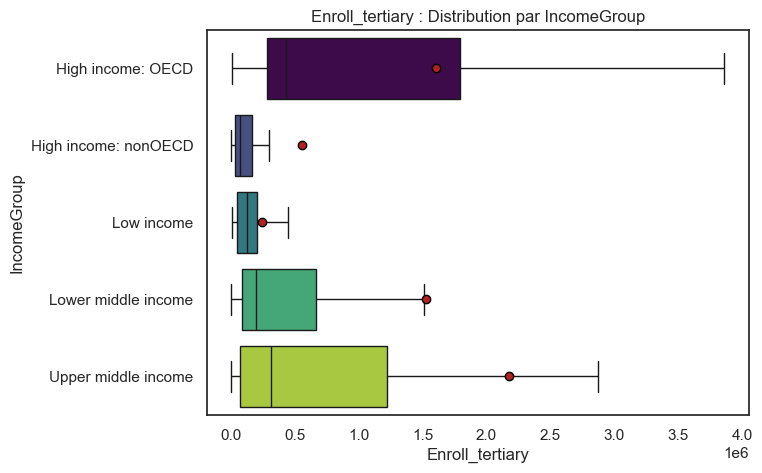

IndicatorCode            Pop_15-24                                      \
                              mean           std       min          q1   
IncomeGroup                                                              
High income: OECD     4.108709e+06  8.203944e+06   44570.0   646956.50   
High income: nonOECD  1.438276e+06  3.624043e+06   14455.0   124493.00   
Low income            6.162909e+06  7.501168e+06  200926.0  2264074.75   
Lower middle income   1.272156e+07  4.115382e+07   38279.0   499407.50   
Upper middle income   9.348399e+06  3.156440e+07   22956.0   533933.50   

IndicatorCode                                            
                         median         q3          max  
IncomeGroup                                              
High income: OECD     1148782.0  4388895.5   45147517.0  
High income: nonOECD   226900.0   519298.0   14661984.0  
Low income            3490703.0  7886367.0   34400594.0  
Lower middle income   1452669.0  5003183.5  244120201.0  
Upper middle income   1331040.0  6677174.0  197026759.0

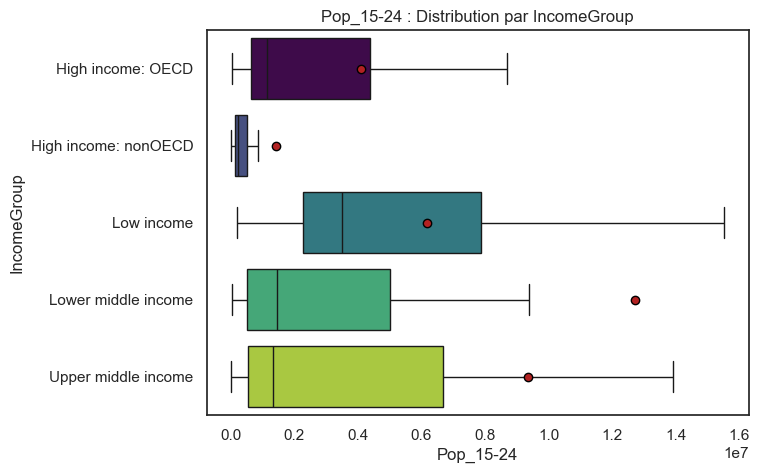

In [91]:
# Statistiques descriptives par income group
stats(df_final, indicator, 'IncomeGroup', colors_income)

- **Observations :** Les pays du groupe 'High Income : OECD' sont les plus intéresants pour notre étude.

## <font color='green'>3.3. Evolution des indicateurs par région et par groupe de revenu<a class="anchor" id="3_3"></a></font>

### Evolution des indicateurs moyens par région

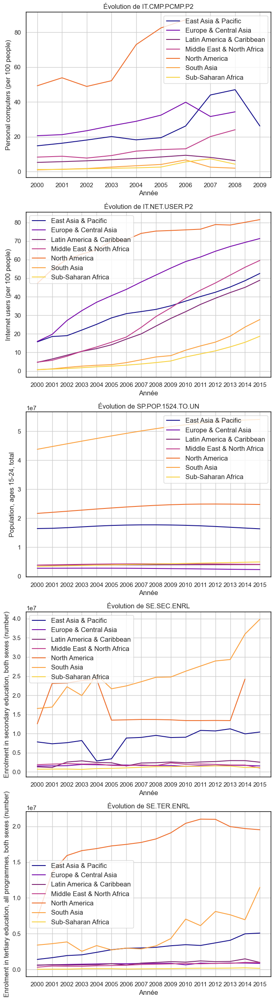

In [92]:
group_indicator(data_past, 'Region', ind_past_list, past_year, colors_reg,1)

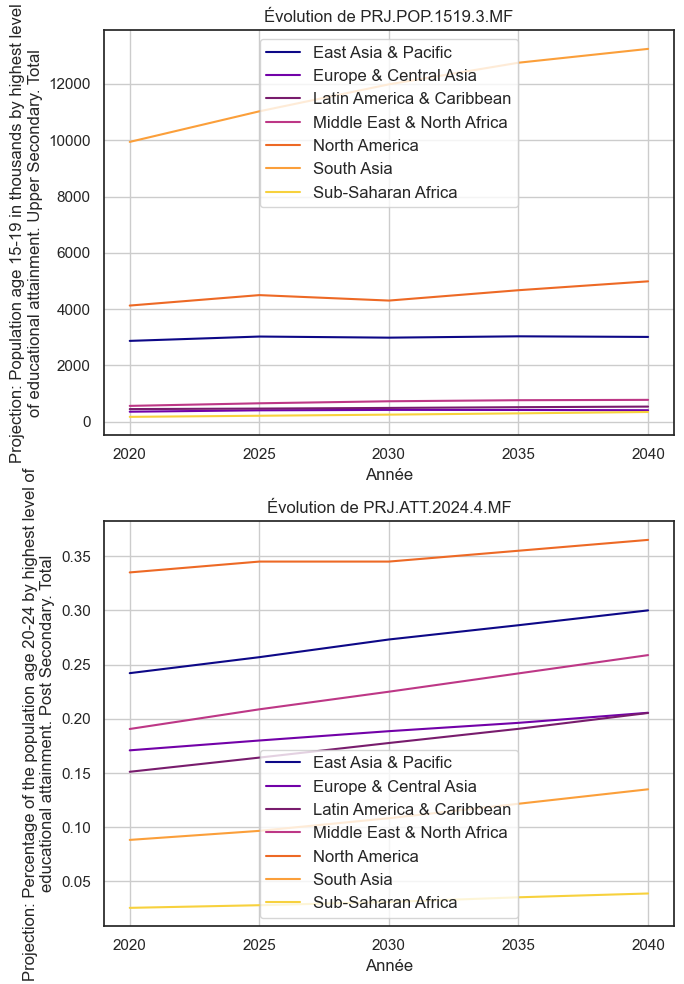

In [93]:
group_indicator(data_proj, 'Region', ind_proj_list, proj_year, colors_reg,1)

- **Observations :**
    - Le nombre d'utilisateurs d'internet est en croissance dans toutes les régions et le nombre de PC pour 100 habitants en décroissance pour East Asia & Pacific et Latin America & Caribbean.
    - La population entre 15 et 24 ans est en croissance en South Asia et stable ou évolution faible dans le sautres régions.
    - Le nombre d'étudiants en secondaire et tertiaire est en croissance en South Asia et East Asia.

### Evolution des indicateurs moyens par income group

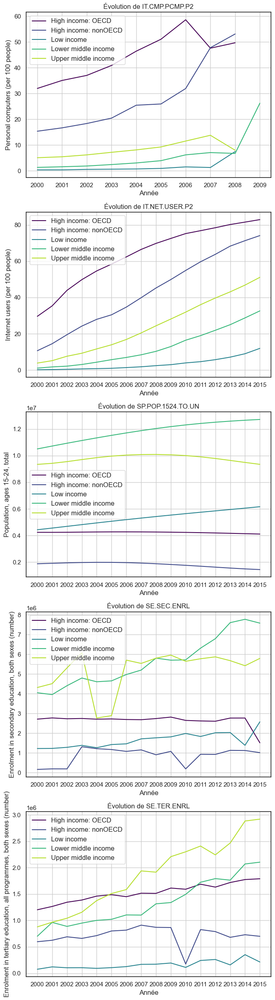

In [94]:
group_indicator(data_past, 'IncomeGroup', ind_past_list, past_year, colors_income, 1)

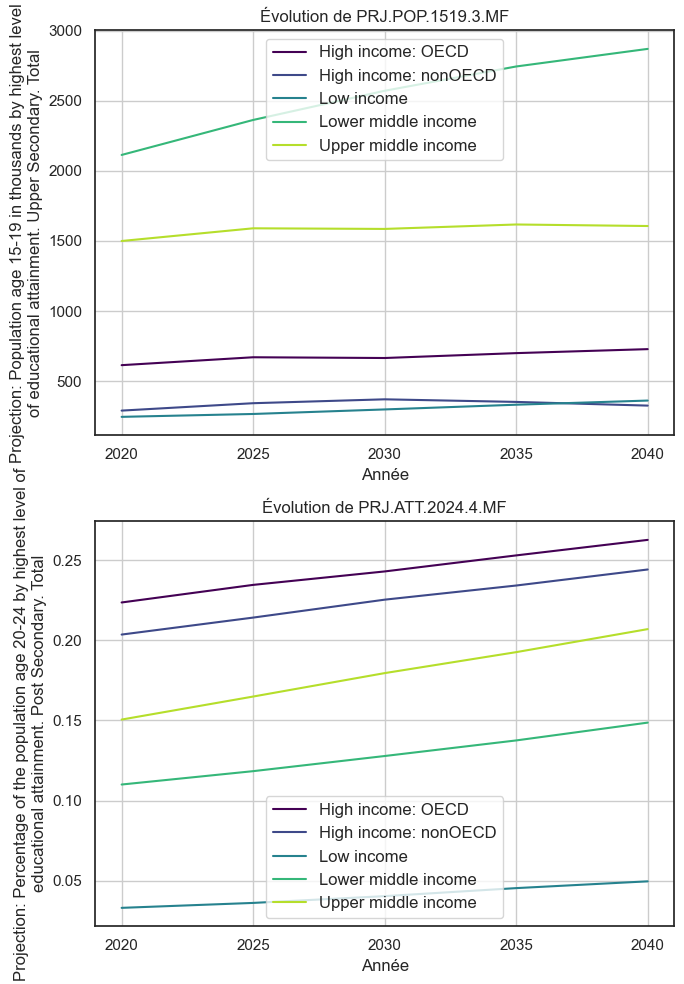

In [95]:
group_indicator(data_proj, 'IncomeGroup', ind_proj_list, proj_year, colors_income, 1)

- **Observations :** Les pays Middle Income ont des indicateurs en croissance, un nombre d'étudiants en secondaire et tertiaire qui croit fortement. Cette tendance est confirmée dans les projections. 

## <font color='green'>3.4. Correlation des indicateurs<a class="anchor" id="3_4"></a></font>

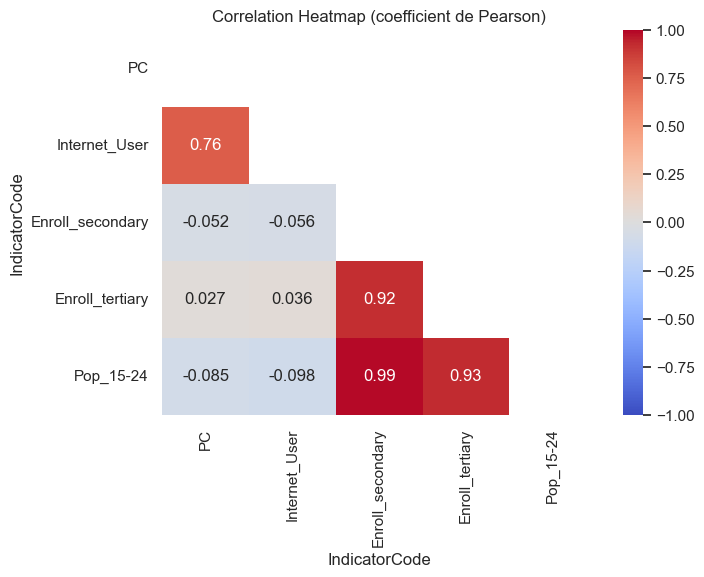

In [96]:
# Calcul du coefficient de corrélation de Pearson et représentation sous forme de heatmap
plt.figure(figsize=figsize)
corr = df_final[indicator].corr(method='pearson')
mask = np.triu(np.ones_like(corr, dtype=bool))
heatmap = sns.heatmap(corr, 
                      vmin=-1, 
                      vmax=1, 
                      annot=True, 
                      cmap='coolwarm', 
                      mask=mask)
heatmap.set_title('Correlation Heatmap (coefficient de Pearson)', fontdict={'fontsize':fontsize})
plt.show()

- **Observations :** il est logique d'oberver que :
    - Le nombre d'ordinateurs pour 100 habitants et le taux d'utilisateurs d'internet sont fortement correlés.
    - Le nombre d'étudiants en secondaire et tertiaire et la population entre 15 et 24 ans le sont aussi.

# <font color='blue'>Partie 4 - Pays avec un fort potentiel de clients<a class="anchor" id="partie4"></a></font>

## <font color='green'>4.1. Calcul d'un score d'attractivité<a class="anchor" id="4_1"></a></font>

### Mise à l'échelle [0,1] des données avec MinMaxScaler

In [97]:
scaler = MinMaxScaler()
df_score = df_final.copy()
df_score[indicator] = scaler.fit_transform(df_score[indicator])
display(df_score.head())

IndicatorCode,CountryCode,CountryName,Region,IncomeGroup,PC,Internet_User,Enroll_secondary,Enroll_tertiary,Pop_15-24
0,ABW,Aruba,Latin America & Caribbean,High income: nonOECD,0.102919,0.900351,0.000000,0.000011,0.000000
1,ALB,Albania,Europe & Central Asia,Upper middle income,0.047544,0.634918,0.002368,0.003686,0.002220
2,ARG,Argentina,Latin America & Caribbean,Upper middle income,0.093958,0.684959,0.034295,0.066152,0.028152
3,ARM,Armenia,Europe & Central Asia,Lower middle income,0.102225,0.591558,0.001790,0.002467,0.001772
4,AUS,Australia,East Asia & Pacific,High income: OECD,0.625270,0.857512,0.018242,0.033502,0.011881


### Calcul d'un score d'attractivité

Les caractéristiques des pays cibles sont :
- Taux d'utilisation d'internet élevé 
- Taux d'accès à un ordinateur élevé
- Population dans la tranche d'âge cible, 15 - 24 ans, élevée
- Nombre d'élèves inscrits dans les parcours lycée (secondary) et université (tertiary) élevés

In [98]:
df_score['Score_attractivite'] = (df_score[indicator].sum(axis=1))/len(indicator)
df_score.sort_values('Score_attractivite', ascending = False).head(10)

IndicatorCode,CountryCode,CountryName,Region,IncomeGroup,PC,Internet_User,Enroll_secondary,Enroll_tertiary,Pop_15-24,Score_attractivite
23,CHN,China,East Asia & Pacific,Upper middle income,0.057891,0.499602,0.664837,1.000000,0.807078,0.605882
62,IND,India,South Asia,Lower middle income,0.032969,0.245746,1.000000,0.740355,1.000000,0.603814
143,USA,United States,North America,High income: OECD,0.830937,0.752979,0.186989,0.450370,0.184891,0.481233
20,CAN,Canada,North America,High income: OECD,0.982070,0.898353,0.020760,0.027936,0.017857,0.389395
103,NLD,Netherlands,Europe & Central Asia,High income: OECD,0.946096,0.932348,0.012392,0.019414,0.008158,0.383682
47,GBR,United Kingdom,Europe & Central Asia,High income: OECD,0.833588,0.935233,0.050555,0.054241,0.031614,0.381046
21,CHE,Switzerland,Europe & Central Asia,High income: OECD,1.000000,0.888001,0.004679,0.006774,0.003869,0.380665
128,SWE,Sweden,Europe & Central Asia,High income: OECD,0.915144,0.920711,0.006452,0.009867,0.004590,0.371353
35,DEU,Germany,Europe & Central Asia,High income: OECD,0.670451,0.889158,0.054847,0.068650,0.035509,0.343723
82,LUX,Luxembourg,Europe & Central Asia,High income: OECD,0.709190,0.990954,0.000297,0.000125,0.000208,0.340155


## <font color='green'>4.2. Analyse des résultats de scoring<a class="anchor" id="4_2"></a></font>

### Score d'attractivité par pays (carte mondiale)

In [99]:
# Représentation géographique du score d'attractivité
fig = px.choropleth(df_score, locations="CountryCode",
                    color="Score_attractivite", 
                    color_continuous_scale=px.colors.sequential.Plasma,
                    hover_name="CountryName")

fig.update_layout(title_text="Représentation géographique des scores d'attractivité", 
                  title_x=0.45,
                  title_font=dict(size=15))
fig.show()

- **Observations :** Nous observons dans le top des pays pour le score d'attractivité la Chine et l'Inde : ce sont les Outliers que nous avons observé plus tôt du fait de leur grande population. Viennent ensuite les pays d'Amérique du Nord, puis l'Europe et l'Australie.

### Statistiques sur les scores d'attractivité

In [100]:
pd.DataFrame(df_score["Score_attractivite"].describe())

,Score_attractivite
count,149.000000
mean,0.154509
std,0.116685
min,0.003036
25%,0.057050
50%,0.137672
75%,0.213375
max,0.605882


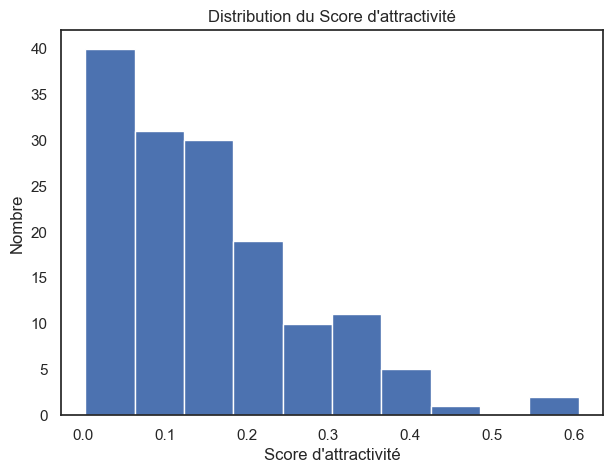

In [101]:
# Distribution des scores d'attractivité
plt.figure(figsize=figsize)
df_score["Score_attractivite"].hist()
plt.title("Distribution du Score d'attractivité", fontsize=fontsize)
plt.xlabel("Score d'attractivité", fontsize=fontsize)
plt.ylabel('Nombre', fontsize=fontsize) 
plt.grid()
plt.show()

### Répartition des scores d'attractivité par région et par groupe de revenu

IndicatorCode              Score_attractivite                                \
                                         mean       std       min        q1   
Region                                                                        
East Asia & Pacific                  0.197984  0.148038  0.039183  0.072483   
Europe & Central Asia                0.223616  0.091879  0.041037  0.154611   
Latin America & Caribbean            0.127409  0.051038  0.046551  0.089106   
Middle East & North Africa           0.165007  0.071041  0.043499  0.120964   
North America                        0.435314  0.064939  0.389395  0.412355   
South Asia                           0.175896  0.212335  0.045112  0.082742   
Sub-Saharan Africa                   0.047727  0.037686  0.003036  0.019300   

IndicatorCode                                             
                              median        q3       max  
Region                                                    
East Asia & Pacific         0.165327  0.309364  0.605882  
Europe & Central Asia       0.213666  0.293165  0.383682  
Latin America & Caribbean   0.116330  0.166062  0.252167  
Middle East & North Africa  0.146439  0.212516  0.298296  
North America               0.435314  0.458274  0.481233  
South Asia                  0.087163  0.134935  0.603814  
Sub-Saharan Africa          0.042542  0.056848  0.141283

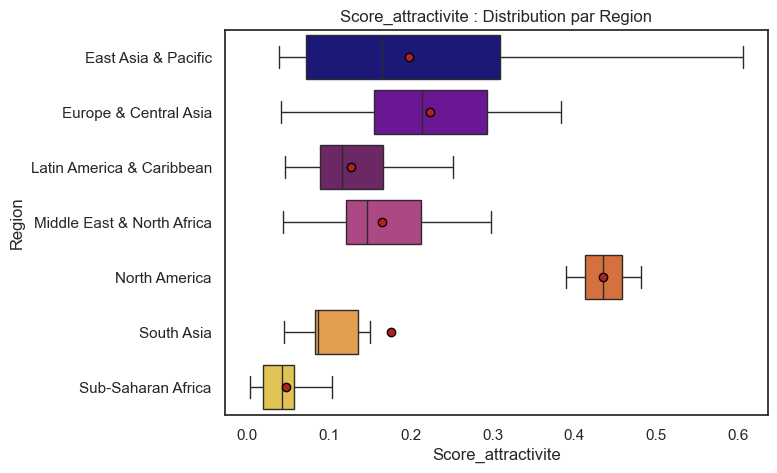

In [102]:
# Statistiques descriptives par income group
stats(df_score, ['Score_attractivite'], 'Region', colors_reg)

IndicatorCode        Score_attractivite                                \
                                   mean       std       min        q1   
IncomeGroup                                                             
High income: OECD              0.292466  0.075431  0.159129  0.235495   
High income: nonOECD           0.218836  0.066746  0.042542  0.199039   
Low income                     0.031123  0.021335  0.003036  0.013474   
Lower middle income            0.099659  0.094028  0.013220  0.055610   
Upper middle income            0.149699  0.086893  0.043389  0.114901   

IndicatorCode                                       
                        median        q3       max  
IncomeGroup                                         
High income: OECD     0.300095  0.336400  0.481233  
High income: nonOECD  0.212230  0.240363  0.319274  
Low income            0.027176  0.044021  0.090079  
Lower middle income   0.080681  0.121343  0.603814  
Upper middle income   0.138933  0.165819  0.605882

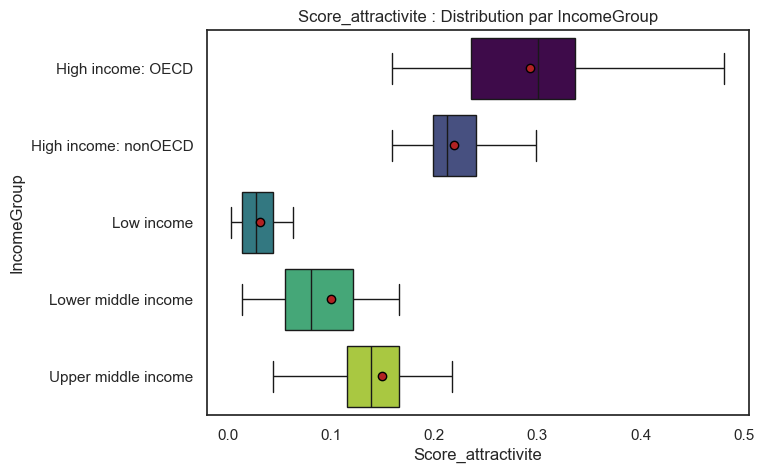

In [103]:
# Statistiques descriptives par income group
stats(df_score, ['Score_attractivite'], 'IncomeGroup', colors_income)

- **Observations :**
    - Les pays de la région North America ont tous des scores d'attractivités élevés, ensuite ce sont les pays de la région Europe & Central Asia. La région East Asia a des résultats les plus dispersés (la Chine et l'Inde sont les extrêmes hauts de cette région).
    - Les pays des groupes de revenus 'High Income' ont les scores d'attractivité les plus hauts, viennent ensuite les pays 'Upper middle income'.
    
Si notre offre est concurrentielle par rapport aux acteurs déjà présents sur le marché, nous pouvons cibler les pays 'High income', membres de l'OCDE pour avoir des garanties de stabilité politique. Si non, les pays du groupe 'Upper middle income' seraient une bonne alternative de développement.

<div class="alert alert-block alert-info">
Pour la suite de l'analyse, nous faisons l'hypothèse que notre offre est concurentielle et nous nous focaliserons sur les pays à haut revenu 'High income: OECD'.
<div>

## <font color='green'>4.3. Pays cibles<a class="anchor" id="4_3"></a></font>

In [104]:
# Top 10 des pays des groupes 'High income'
df_top_score = df_score.loc[df_score['IncomeGroup']=='High income: OECD']\
                    .sort_values('Score_attractivite', ascending = False)\
                    .head(10)

top = df_top_score['CountryCode'].to_list()

display(df_top_score[['Region', 'CountryCode', 'CountryName', 'Score_attractivite']])

IndicatorCode,Region,CountryCode,CountryName,Score_attractivite
143,North America,USA,United States,0.481233
20,North America,CAN,Canada,0.389395
103,Europe & Central Asia,NLD,Netherlands,0.383682
47,Europe & Central Asia,GBR,United Kingdom,0.381046
21,Europe & Central Asia,CHE,Switzerland,0.380665
128,Europe & Central Asia,SWE,Sweden,0.371353
35,Europe & Central Asia,DEU,Germany,0.343723
82,Europe & Central Asia,LUX,Luxembourg,0.340155
45,Europe & Central Asia,FRA,France,0.332645
104,Europe & Central Asia,NOR,Norway,0.330046


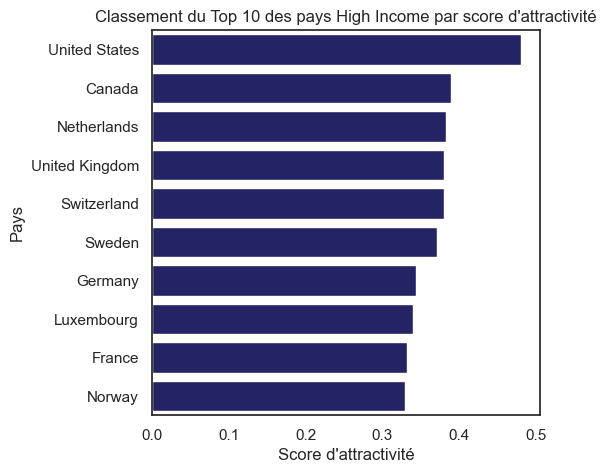

In [105]:
plt.figure(figsize=(5,height))

sns.barplot(data = df_top_score,
            x = 'Score_attractivite',
            y = 'CountryName',
            color ='midnightblue')

plt.title("Classement du Top 10 des pays High Income par score d'attractivité", fontsize=fontsize)
plt.xlabel("Score d'attractivité", fontsize=fontsize)
plt.ylabel('Pays', fontsize=fontsize)
plt.show()

### Evolution des indicateurs pour le top 10 des pays

#### Evolution des indicateurs entre 2000 et 2015

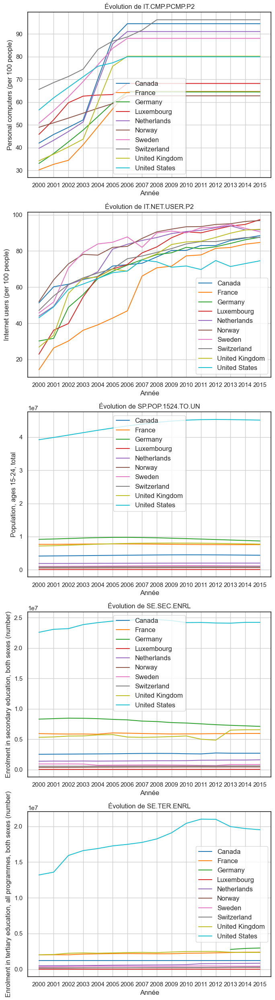

In [106]:
top_country(data_past, top, ind_past_list, past_year, colors_country,1)

#### Projection : Evolution de la population cible entre 2020 et 2040

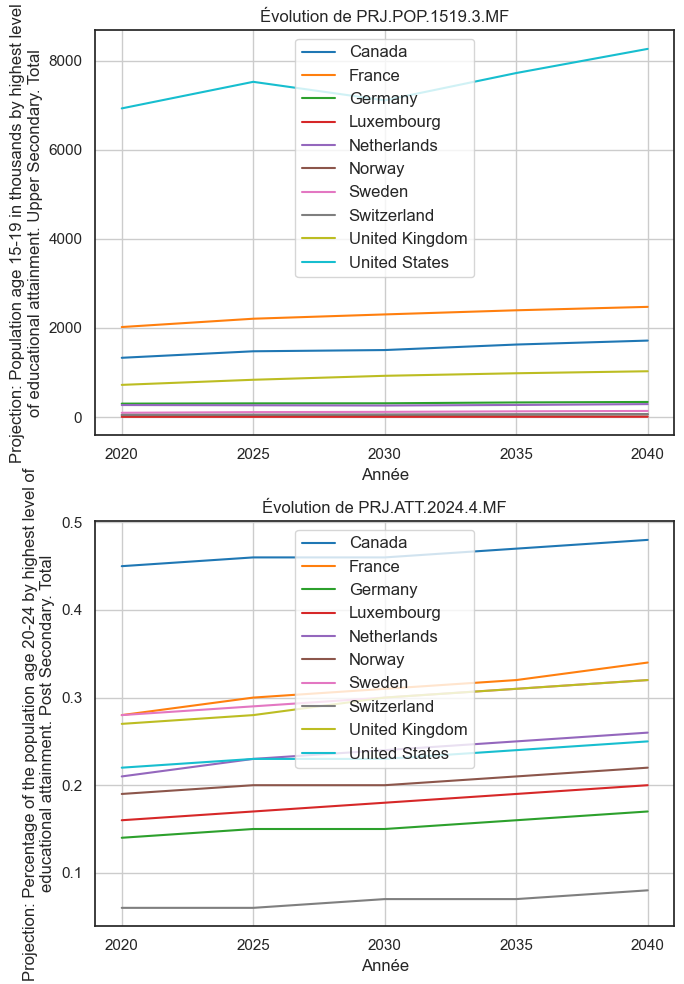

In [107]:
top_country(data_proj, top, ind_proj_list, proj_year, colors_country, 1)

- **Observations :**
    - PC - IT.CMP.PCMP.P2 : il s'agit d'un ancien indicateur (pas de données après 2006/2008). une extrapolation des données pourrait être réalisée ou rechercher d'autres données permettaient d'avoir des informations similaires. A voir également si l'ordinateur est nécessaire ou non pour les formations proposées par Academy.
    - Internet User : IT.NET.USER.P2 : indicateur en croissance pour tous les pays.
    - Population de la tranche d'âge 15-24 ans - SP.POP.1524.TO.UN : en décroissance pour Allemagne, France et Royaume-unis et stables pour le sutres pays
    - Elèves inscrits en secondaire - SE.SEC.ENRL : croissance pour les Etats-Unis, en décroissance pour l'Allemagne et stables depuis 2013 pour les autres pays. Les projections indiquent une croissance du nombre d'éleves ayant atteint un niveau secondaire supérieur pour les Etats-Unis, le Canada, la France et le Royaume-Unis et une stabilité pour les autres.
    - Elèves inscrit en tertiaire - SE.TER.ENRL : en croissance pour la France, l'Allemagne et les Pays-Bas, décroissance pour les Etats-Unis, croissance faible/stable pour les autres pays. Projection : % de jeunes 20-24 ayant atteint un niveau post-secondaire en croissance.

## <font color='green'>4.4. Conclusion et Perspectives<a class="anchor" id="4_4"></a></font>

**Données :**
En conclusion, le jeu de données permet bien d'informer les décisions d'ouverture vers de nouveaux pays, comme le démontre l'analyse pré-exploratoire ci-dessus.
Les jeux de données les plus pertinents sont : 
- EdStats country
- EdStatsSeries
- EdStatsData    

**Recommandations :** 
- Développement à l’international dans les pays à hauts revenus et plus particulièrement dans les pays anglophones : Etats-Unis,  Canada et Royaume-Unis qui ont un fort potentiel qui tend à croître dans les années à venir.
- Alternative : les pays à revenus moyens supérieurs (Upper Middle income) qui auront un fort potentiel dans les années à venir.

**Perspectives :** 
Cette première analyse peut facilement être adaptée, par exemple, en :
- Changant le groupe de revenu des pays cibles
- Ajoutant la langue(s) parlée(s) dans le pays pour définir des stratégies de développement pour une même langue (plus rentable)
- Prenant en compte le taux d'évolution des indicateurs
- Pondérant les indicateurs dans le calcul du score d'attractivité
- Ajoutant d'autres indicateurs comme : 
    - le taux de chômage
    - la stabilité politique du pays
    - le PIB par habitants (plus précis que le groupe de revenu)


Une analyse de clustering pourrait également être menée pour définir des groupes de pays où appliquer des stratégies de développement similaires.